# 21 cm × Galaxy Cross-Correlation: HERA × Euclid (Lightcone)
### Simulating cross-power spectra with 21cmFASTv4 (Davies et al. 2025)

This notebook uses the discrete source model introduced in
[Davies, Mesinger & Murray (2025)](https://arxiv.org/abs/2504.17254) to:

1. Run a **21cmFASTv4** lightcone simulation with discrete galaxy sources
2. Apply a **Euclid-like** photometric selection to the galaxy catalogue
3. Compute the **2D cylindrical cross-power spectrum** $P_{21\times\mathrm{gal}}(k_\perp, k_\parallel)$
4. Estimate the **SNR** for a HERA × Euclid cross-correlation detection

**Key difference from the coeval version:** Here a full **lightcone** is generated
via `RectilinearLightconer` + `run_lightcone`, so the line-of-sight axis spans a
redshift range rather than a single snapshot. The non-cubic box dimensions
$(N_\perp \times N_\perp \times N_z)$ are handled throughout.

---

**Requirements:**
- `21cmFAST >= 4.0.0` — install via `pip install 21cmFAST` (requires C compiler, FFTW3, GSL)
- `numpy`, `matplotlib`, `scipy`, `astropy`

**References:**
- Davies, Mesinger & Murray (2025) — [arXiv:2504.17254](https://arxiv.org/abs/2504.17254) — 21cmFASTv4 discrete source model
- Gagnon-Hartman, Davies & Mesinger (2025) — [arXiv:2502.20447](https://arxiv.org/abs/2502.20447) — galaxy–21cm cross-correlation detection forecasts
- La Plante et al. (2023) — [arXiv:2205.09770](https://arxiv.org/abs/2205.09770) — uncertainty formalism
- Euclid Collaboration (2022) — [arXiv:2108.01201](https://arxiv.org/abs/2108.01201) — Euclid survey specifications

## Imports and setup

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import quad
from scipy.ndimage import generic_filter
import warnings

# ── Pipeline code — single source of truth ───────────────────────────────────
# Every formula below is imported from src/, not reimplemented here, so this
# notebook and the HPC run (run_pipeline.py) cannot drift apart.  See
# docs/uncertainty_budget.md for the full specification.
#
# NOTE: do NOT import src.figures — it forces the non-interactive "Agg"
# backend on import, which would silently disable inline plotting here.
from src.conversions import (
    Luv_to_Muv,                                 # L_UV [erg/s/Hz] -> absolute AB magnitude
    Muv_to_Luv,                                 # absolute AB magnitude -> L_UV
    sfr_to_Luv,                                 # Madau & Dickinson 2014, kappa_UV = 1.15e-28
    sheth_tormen_bias,                          # b_h from the SQUARED peak height, hmf's MassFunction.nu
    survey_area_to_box_size,                    # survey footprint [deg^2] -> 21cmFAST BOX_LEN/HII_DIM/DIM
)
from src.analysis import (
    comoving_distance,                          # D_C(z)  [Mpc]
    deposit_halo_field,                         # halo catalogue -> 3D grid, optionally weighted
    compute_all_power_spectra,                  # the three 2D cylindrical spectra
    compute_uncertainty_budget,                 # photo-z -> wedge -> noise -> SNR
    galaxy_overdensity_from_catalogue,          # Euclid-selected catalogue -> delta_gal
    fov_wedge_slope,                            # HERA primary-beam wedge line
    horizon_wedge_slope,                        # foreground horizon wedge line
    hubble_parameter,                           # H(z)  [km/s/Mpc]
    star_formation_timescale,                   # t_sf = t_STAR x t_H(z), 21cmFAST's own timescale
    stellar_mass_to_sfr,                        # M_star -> SFR using that timescale
    select_euclid_halos,                        # the Euclid M_UV window, as the pipeline applies it
    T_STAR_DEFAULT,                             # 21cmFAST t_STAR, 'simple' template = 0.5
)

warnings.filterwarnings("ignore")

# ── Check whether 21cmFAST is installed ──────────────────────────────────────
try:
    import py21cmfast as p21c
    from astropy.cosmology import Planck18
    import astropy.units as u
    HAS_21CMFAST = True
    print(f"21cmFAST version: {p21c.__version__}")
except ImportError:
    HAS_21CMFAST = False
    print("21cmFAST not installed — will use synthetic fields for demonstration.")
    print("Install with:  pip install 21cmFAST")

# ── Matplotlib defaults ──────────────────────────────────────────────────────
plt.rcParams.update({
    "figure.dpi":      300,
    "font.size":       12,
    "axes.labelsize":  13,
    "legend.fontsize": 10,
    "axes.grid":       False,
})

21cmFAST version: 4.1.1


---
## ★ CONFIGURATION — edit only this cell ★

All user-adjustable parameters are collected here. Every subsequent cell reads
from these variables; no other cell needs to be edited for a standard run.

---

In [7]:
# ===========================================================================
#  ★ CONFIGURATION — ALL USER-ADJUSTABLE PARAMETERS ★
#  Edit values in this cell only. All other cells read from here.
#
#  These values match run_simulation.py's configuration block (lines 89–164)
#  so the notebook and the HPC run describe the same experiment.
# ===========================================================================

# ---------------------------------------------------------------------------
#  Survey footprint  ->  simulation box geometry
# ---------------------------------------------------------------------------
# The box is sized from the survey being forecast rather than chosen by hand.
# Euclid Deep Field Fornax: 10 deg^2, centred RA 03:31:43.6, Dec -28:05:18.6.
SURVEY_AREA_DEG2 = 10.0     # Euclid Deep Field Fornax footprint  [deg^2]
SURVEY_Z_CENTRAL = 7.0      # central redshift of the analysis

# sigma_z is the ABSOLUTE photometric redshift error, not sigma_z/(1+z).
# Euclid's requirement is quoted fractionally, sigma_z/(1+z) < 0.05, which at
# z_obs = 7 means sigma_z ~ 0.45.  The earlier value of 0.059 was the
# fractional number used as though it were absolute - a factor ~7.6 too small.
# See docs/uncertainty_budget.md 4.2 and docs/HPC.md 11.8.
# Defined here, not in the Euclid block below, because it now also sets the
# line-of-sight depth of the box.
photoz_uncertainty  = 0.45   # sigma_z photometric redshift error (absolute)

# CHOICE, not a default: how many sigma_z of photo-z scatter the box spans.
# PHOTOZ_N_SIGMA = 1 -> delta_z = 0.90, z = 6.55-7.45, L_los = 315.6 Mpc
# PHOTOZ_N_SIGMA = 2 -> delta_z = 1.80, z = 6.10-7.90, L_los = 634.9 Mpc
# This forecast adopts +/-1 sigma.
PHOTOZ_N_SIGMA = 1
SURVEY_DELTA_Z = 2 * PHOTOZ_N_SIGMA * photoz_uncertainty

# ---------------------------------------------------------------------------
#  Simulation grid  (derived - do not hardcode BOX_LEN/HII_DIM/DIM)
# ---------------------------------------------------------------------------
# HII_DIM follows from target_cell_size_mpc = 2.0, the resolution of the old
# 256 Mpc / 128^3 grid, so covering the footprint does not coarsen M_cell.
# 486.33 / 2.0 = 244 cells, snapped up to the next power of two for the FFTs.
SIM_BOX = survey_area_to_box_size(
    area_deg2=SURVEY_AREA_DEG2,
    z_central=SURVEY_Z_CENTRAL,
    delta_z=SURVEY_DELTA_Z,
    cosmo=None,              # -> astropy Planck18, as used for the endpoints
    target_cell_size_mpc=2.0,
)

HII_DIM = SIM_BOX.hii_dim    # 256 cells per side (low-res grid)
BOX_LEN = SIM_BOX.box_len    # 486.33 Mpc comoving, from the 10 deg^2 footprint
DIM     = SIM_BOX.dim        # 768, high-res grid for initial conditions

# ---------------------------------------------------------------------------
#  Lightcone redshift range  (derived from the photo-z depth above)
# ---------------------------------------------------------------------------
# Was hardcoded z = 6.5-7.5; now +/-1 sigma_z about z_central = 6.55-7.45.
z_min = SIM_BOX.z_min   # 6.55 - nearest redshift (low-z end of lightcone)
z_max = SIM_BOX.z_max   # 7.45 - farthest redshift (high-z end)

# ---------------------------------------------------------------------------
#  Euclid-like survey parameters
# ---------------------------------------------------------------------------
M_UV_faint          = -18.0  # faint-end UV magnitude cut (Euclid depth) - obtained from collaborators
M_UV_bright         = -22.66 # bright-end UV magnitude cut - obtained from collaborators

# photoz_uncertainty (sigma_z = 0.45, absolute) is set in the survey-footprint
# block above, because it now also sets the line-of-sight depth of the box.

mean_galaxy_density = 3e-3   # n_bar  [h^3 Mpc^-3] - from collaborators

# ---------------------------------------------------------------------------
#  Galaxy bias
# ---------------------------------------------------------------------------
# galaxy_bias = 8              # linear bias b (typical for high-z LBGs)

# ---------------------------------------------------------------------------
#  Cosmological parameters (Planck 2018)
# ---------------------------------------------------------------------------
# Literal values, matching run_simulation.py:136-137 and hence the
# HUBBLE_CONSTANT / OMEGA_M_0 attributes of outputs/lightcone_data.h5, which
# is what run_pipeline.py reads.  astropy's Planck18 (H0 = 67.66,
# Om0 = 0.30966) is used only for the comoving-distance endpoints below,
# exactly as run_simulation.py does.
OMEGA_M_0       = 0.315      # matter density parameter
HUBBLE_CONSTANT = 67.36      # H_0  [km s^-1 Mpc^-1]

# ---------------------------------------------------------------------------
#  Physical constants
# ---------------------------------------------------------------------------
SPEED_OF_LIGHT_KMS = 3e5         # c  [km s^-1]
SPEED_OF_LIGHT_MPS = 3e8         # c  [m s^-1]
F_21_MHZ           = 1420.405    # 21cm rest frequency  [MHz]
F_21_HZ            = F_21_MHZ * 1e6

# ---------------------------------------------------------------------------
#  HERA instrument
# ---------------------------------------------------------------------------
HERA_DISH_DIAMETER = 14.0        # dish diameter  [m]
integration_time   = 1000 * 3600 # total integration  [s]  (1000 h)
bandwidth          = 8e6         # per-band bandwidth  [Hz]  (8 MHz)

# ---------------------------------------------------------------------------
#  Foreground wedge
# ---------------------------------------------------------------------------
# 0.1 h Mpc^-1 at h = 0.6766 — Pober et al. (2014) "moderate" foreground
# model, the 21cmSense `horizon_buffer` default.  The earlier 0.02 Mpc^-1 had
# no stated provenance.  See docs/uncertainty_budget.md §4.2.
wedge_buffer = 0.0677            # safety margin beyond horizon line  [Mpc^-1]

# ---------------------------------------------------------------------------
#  Power spectrum binning
# ---------------------------------------------------------------------------
n_bins_perp     = 20 # Number of bins in the kperp space
n_bins_parallel = 20 # Number of bins in the kpar space

# ===========================================================================
#  End of configuration
# ===========================================================================

# Bundle the cosmology once; every src.analysis call below takes it as kwargs
# so no function silently falls back to its own defaults.
COSMOLOGY = dict(
    hubble_constant=HUBBLE_CONSTANT,
    omega_m=OMEGA_M_0,
    speed_of_light_kms=SPEED_OF_LIGHT_KMS,
)

## 1  Derived quantities

Compute the lightcone geometry from the configuration above: the comoving
line-of-sight extent $L_{\rm LOS}$, the number of LOS slices $N_z$ (matched
to the transverse cell size), and the redshift array for each slice.

This mirrors §1 of `run_simulation.py`, and $H(z)$ / $D_C(z)$ are **imported
from `src/analysis.py`** rather than redefined here.

**Hubble parameter** (flat ΛCDM), `analysis.hubble_parameter`:

$$
H(z) = H_0 \sqrt{\Omega_{m,0}(1+z)^3 + (1-\Omega_{m,0})}
$$

with $H_0$ = `HUBBLE_CONSTANT` = 67.36 and $\Omega_{m,0}$ = `OMEGA_M_0` = 0.315,
the literal values `run_simulation.py` uses and writes to the HDF5 root
attributes. Units: km s⁻¹ Mpc⁻¹. At $z = 7$ this gives $H = 857.26$ km s⁻¹ Mpc⁻¹.

**Comoving distance**, `analysis.comoving_distance`:

$$
D_C(z) = c \int_0^{z} \frac{dz'}{H(z')}
$$

For the lightcone **endpoints** we use `astropy`'s `Planck18.comoving_distance`
when available — more precise, and again matching `run_simulation.py` §1 — and
fall back to numerically integrating the $H(z)$ above otherwise. Everything
downstream (wedge geometry, photo-$z$ smearing, noise) uses the configured
`HUBBLE_CONSTANT` / `OMEGA_M_0`, so the analysis is self-consistent with the
simulation that produced the fields. $D_C(7) = 8821.33$ Mpc.

**Comoving line-of-sight extent** of the lightcone:

$$
L_{\rm los} = D_C(z_{\rm max}) - D_C(z_{\rm min})
$$

**Cell size** (comoving), from the box geometry:

$$
\Delta x = \frac{L_{\rm box}}{N_{\rm HII\_DIM}}
$$

**Reference redshift**, taken as the midpoint of the lightcone (used for noise
and wedge calculations):

$$
z_{\rm obs} = \frac{z_{\rm min} + z_{\rm max}}{2}
$$

**Number of line-of-sight slices**, matched to the transverse cell size so
voxels are roughly cubic, with a floor for short test runs:

$$
N_z = \max\left(\text{round}\left(\frac{L_{\rm los}}{\Delta x}\right),\ N_z^{\rm min}\right)
$$

Redshift slices are then evenly spaced in $z$ from $z_{\rm min}$ to $z_{\rm max}$
(**not** evenly spaced in comoving distance).

**Node redshifts** — the discrete redshifts at which 21cmFAST computes full
coeval simulation snapshots, later interpolated to build the lightcone. Density
is fixed at ~10 nodes per unit redshift, with a floor of 5:

$$
n_{\rm nodes} = \max\left(\text{round}\left(10\,(z_{\rm max}-z_{\rm min})\right),\ 5\right)
$$

Ordered high-$z$ → low-$z$, matching 21cmFAST's simulation direction (early
universe first).

In [8]:
# ── Hubble parameter ─────────────────────────────────────────────────────────
# hubble_parameter() is imported from src.analysis; pass the configured
# cosmology explicitly rather than relying on its defaults.
Hz_obs_check = hubble_parameter(7.0, HUBBLE_CONSTANT, OMEGA_M_0)

# ── Comoving distances to lightcone endpoints ────────────────────────────────
# astropy's Planck18 when available (more precise), else the configured flat
# LCDM integrated numerically — identical to run_simulation.py §1.
if HAS_21CMFAST:
    D_min = Planck18.comoving_distance(z_min).to(u.Mpc).value
    D_max = Planck18.comoving_distance(z_max).to(u.Mpc).value
else:
    D_min = comoving_distance(z_min, **COSMOLOGY)
    D_max = comoving_distance(z_max, **COSMOLOGY)

L_los     = D_max - D_min   # comoving LOS extent  [Mpc]
cell_size = BOX_LEN / HII_DIM # comoving cell size [Mpc]

# ── Reference redshift (centre of lightcone, used for noise / wedge) ─────────
z_obs = 0.5 * (z_min + z_max)

# ── Number of LOS slices ──────────────────────────────────────────────────────
# Normally matched to the transverse cell size; override via minimum_los_slices
# for test runs where the z-range implies fewer natural slices.
minimum_los_slices = 100
N_z = max(int(round(L_los / cell_size)), minimum_los_slices)

# Redshift and distance for each LOS slice (low-z → high-z)
lc_redshifts = np.linspace(z_min, z_max, N_z)

# ── Node redshifts for 21cmFAST (coeval snapshots driving the physics) ────────
# Use ~10 nodes per unit redshift for good accuracy
n_nodes      = max(int(round(10 * (z_max - z_min))), 5)
node_redshifts = np.linspace(z_max, z_min, n_nodes)   # high-z → low-z

# ── Summary ──────────────────────────────────────────────────────────────────
print(f"Box         : {BOX_LEN:.1f} Mpc,  {HII_DIM}³ cells  →  cell size = {cell_size:.2f} Mpc")
print(f"Footprint   : {SURVEY_AREA_DEG2:g} deg² at z = {SURVEY_Z_CENTRAL:g} (Euclid Deep Field Fornax)"
      f"  →  BOX_LEN = {BOX_LEN:.1f} Mpc,  Δz = {SURVEY_DELTA_Z:g} (±{PHOTOZ_N_SIGMA}σ_z)")
print(f"Lightcone   : z = {z_min} → {z_max}   (reference z_obs = {z_obs})")
print(f"LOS extent  : {L_los:.1f} Mpc  →  N_z = {N_z} slices")
print(f"Box shape   : ({HII_DIM}, {HII_DIM}, {N_z})")
print(f"Node redshifts: {n_nodes} nodes from z={z_max} to z={z_min}")
print(f"Cosmology   : H_0 = {HUBBLE_CONSTANT}, Ω_m0 = {OMEGA_M_0}  →  H(7) = {Hz_obs_check:.2f} km/s/Mpc")
print(f"Euclid      : M_UV < {M_UV_faint},  σ_z = {photoz_uncertainty} (absolute)")

Box         : 256 Mpc,  128³ cells  →  cell size = 2.0 Mpc
Lightcone   : z = 6.5 → 7.5   (reference z_obs = 7.0)
LOS extent  : 350.8 Mpc  →  N_z = 175 slices
Box shape   : (128, 128, 175)
Node redshifts: 10 nodes from z=7.5 to z=6.5
Cosmology   : H_0 = 67.36, Ω_m0 = 0.315  →  H(7) = 857.26 km/s/Mpc
Euclid      : M_UV < -18.0,  σ_z = 0.45 (absolute)


## 2  Run the 21cmFASTv4 lightcone simulation

The v4 API uses `RectilinearLightconer` to specify the LOS slice redshifts and
the quantities to store, then `run_lightcone` to execute the simulation.

Compared to a coeval run, the lightcone:
- Evolves the physics across the full redshift range `[z_min, z_max]`
- Stores one coeval slice per LOS cell rather than a single snapshot
- Produces a rectangular `(HII_DIM, HII_DIM, N_z)` output volume

Available lightcone quantities (from `LightCone.get_fields`):
`brightness_temp`, `density`, `neutral_fraction`, `halo_sfr`, `n_ion`,
`kinetic_temperature`, `z_reion`, `mean_free_path`, …

In [10]:
if HAS_21CMFAST:
    print("Running 21cmFAST lightcone simulation …")
    print(f"  z = {z_min} → {z_max},  N_z = {N_z} slices")

    inputs = p21c.InputParameters.from_template(
        ["simple"],
        random_seed=42,
    )

    inputs = inputs.clone(
        node_redshifts=node_redshifts,
        simulation_options={
            "HII_DIM": HII_DIM,
            "BOX_LEN": BOX_LEN,
            "DIM":     DIM,
        },
        matter_options={
            "USE_INTERPOLATION_TABLES": "hmf-interpolation",
        },
    )

    lightconer = p21c.RectilinearLightconer(
        lc_redshifts=lc_redshifts,
        quantities=("brightness_temp", "density", "neutral_fraction", "halo_sfr"),
    )

    lightcone = p21c.run_lightcone(
        lightconer=lightconer,
        inputs=inputs,
        include_dvdr_in_tau21=False,
        apply_rsds=False,
    )
    brightness_temp_field = lightcone.lightcones["brightness_temp"]   # (HII_DIM, HII_DIM, N_z)
    density_field         = lightcone.lightcones["density"]
    neutral_fraction      = lightcone.lightcones["neutral_fraction"]

    # Update LOS geometry from the actual simulation output
    N_z   = lightcone.n_slices
    L_los = lightcone.lightcone_dimensions[2]   # actual LOS comoving size  [Mpc]
    lc_dist_Mpc = lightcone.lightcone_distances.to(u.Mpc).value   # (N_z,) array

    print(f"  Lightcone shape : {lightcone.shape}")
    print(f"  LOS extent      : {L_los:.1f} Mpc")
    print(f"  <x_HI>          : {np.mean(neutral_fraction):.3f}")
    print(
        f"  dT_b            : "
        f"[{brightness_temp_field.min():.1f}, "
        f"{brightness_temp_field.max():.1f}] mK"
    )

else:
    # ==================================================================
    #  Synthetic lightcone fallback (21cmFAST not installed)
    # ==================================================================
    print("Generating synthetic lightcone fields (21cmFAST not available) …")
    np.random.seed(42)

    N = HII_DIM
    kx     = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
    ky     = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
    kz_los = np.fft.fftfreq(N_z, d=cell_size) * 2 * np.pi
    KX, KY, KZ = np.meshgrid(kx, ky, kz_los, indexing="ij")
    K_magnitude = np.sqrt(KX**2 + KY**2 + KZ**2)
    K_magnitude[0, 0, 0] = 1.0

    # Matter overdensity from P(k) ∝ k^−2
    ps_amplitude = K_magnitude**(-2)
    ps_amplitude[0, 0, 0] = 0.0
    random_phases = (
        np.random.standard_normal((N, N, N_z))
        + 1j * np.random.standard_normal((N, N, N_z))
    )
    density_field = np.fft.ifftn(np.sqrt(ps_amplitude / 2) * random_phases).real
    density_field = (density_field - density_field.mean()) / density_field.std() * 0.5

    # Neutral fraction via inside-out reionisation
    k_bubble = 2 * np.pi / 10.0
    smoothed = np.fft.ifftn(
        np.fft.fftn(density_field) * np.exp(-0.5 * K_magnitude**2 / k_bubble**2)
    ).real
    neutral_fraction = (smoothed < np.percentile(smoothed, 50)).astype(float)

    # Brightness temperature with redshift evolution along LOS
    T0_per_slice = 27.0 * np.sqrt((1 + lc_redshifts) / 10.0)   # (N_z,)
    brightness_temp_field = (
        T0_per_slice[np.newaxis, np.newaxis, :]
        * neutral_fraction * (1.0 + density_field)
    )

    lc_dist_Mpc = D_min + (D_max - D_min) * np.linspace(0, 1, N_z)

    print(f"  Shape  : {brightness_temp_field.shape}")
    print(f"  ⟨x_HI⟩ : {np.mean(neutral_fraction):.3f}")
    print(f"  δT_b   : [{brightness_temp_field.min():.1f}, {brightness_temp_field.max():.1f}] mK")

Running 21cmFAST lightcone simulation …
  z = 6.5 → 7.5,  N_z = 175 slices
  Lightcone shape : (128, 128, 175)
  LOS extent      : 350.0 Mpc
  <x_HI>          : 0.154
  dT_b            : [0.0, 24.9] mK


In [11]:
# ==========================================================================
# Extract actual 21cmFASTv4 halo catalogue at z_obs
# ==========================================================================


print(f"Extracting halo catalogue at z = {z_obs} ...")

# 1. Compute initial conditions using the same inputs as the lightcone
initial_conditions = p21c.compute_initial_conditions(
    inputs=inputs,
)

# 2. Draw the Lagrangian halo catalogue at z_obs
halo_catalog = p21c.determine_halo_catalog(
    redshift=z_obs,
    inputs=inputs,
    initial_conditions=initial_conditions,
)

# 3. Perturb halos to Eulerian positions at z_obs
perturbed_halos = p21c.perturb_halo_catalog(
    inputs=inputs,
    initial_conditions=initial_conditions,
    halo_catalog=halo_catalog,
)

# 4. Pull useful arrays
halo_masses = perturbed_halos.halo_masses
halo_coords = perturbed_halos.halo_coords
stellar_masses = perturbed_halos.stellar_masses
halo_sfr = perturbed_halos.sfr

print(f"Number of halos: {perturbed_halos.n_halos}")
# print(f"Halo mass range: {halo_masses.min():.3e} - {halo_masses.max():.3e} Msun")
# print(f"Stellar mass range: {stellar_masses.min():.3e} - {stellar_masses.max():.3e} Msun")
# print(f"SFR range: {halo_sfr.min():.3e} - {halo_sfr.max():.3e} Msun/yr")

Extracting halo catalogue at z = 7.0 ...
Number of halos: 114291212


Perturbed halo catalogue attributes:
['fesc_sfr', 'halo_coords', 'halo_masses', 'n_halos', 'sfr', 'sfr_mini', 'stellar_masses']

Catalogue diagnostics:
halo_coords shape = (114291212, 3), dtype = float32
halo_masses shape = (114291212,), dtype = float32
N_halos = 114,291,212
coord min/max = 0.000, 256.000
mass min/max = 1.000e+08, 1.767e+12 Msun
Interpreting halo coordinates as Mpc coordinates.


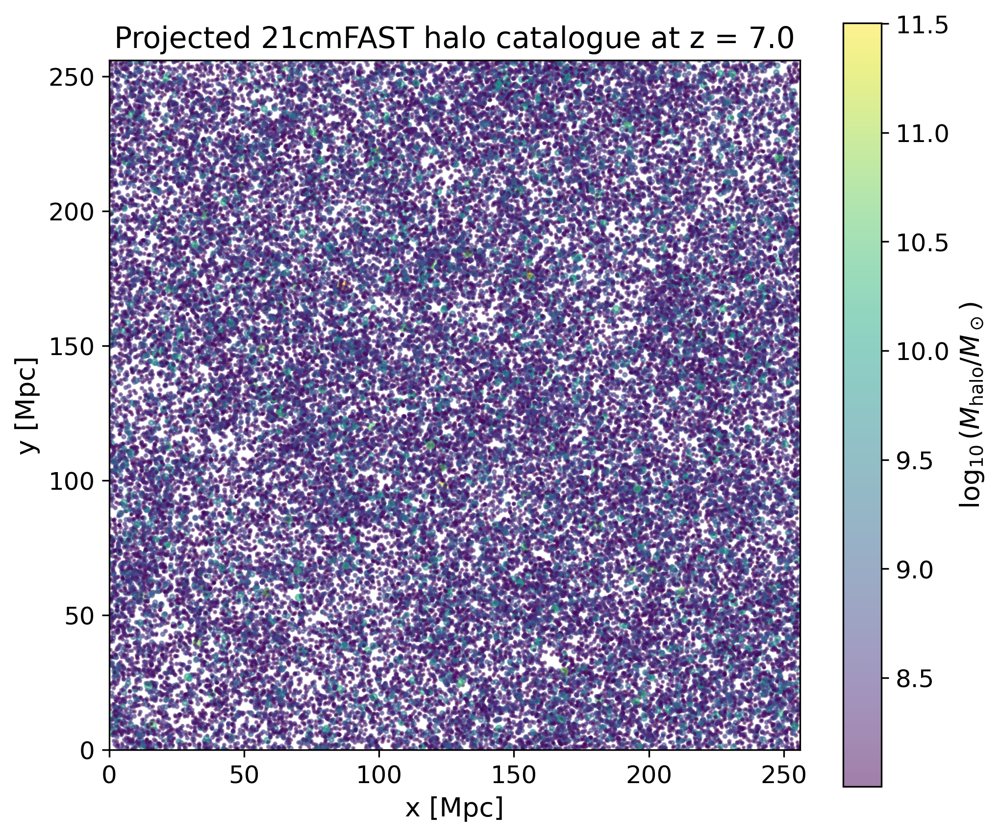

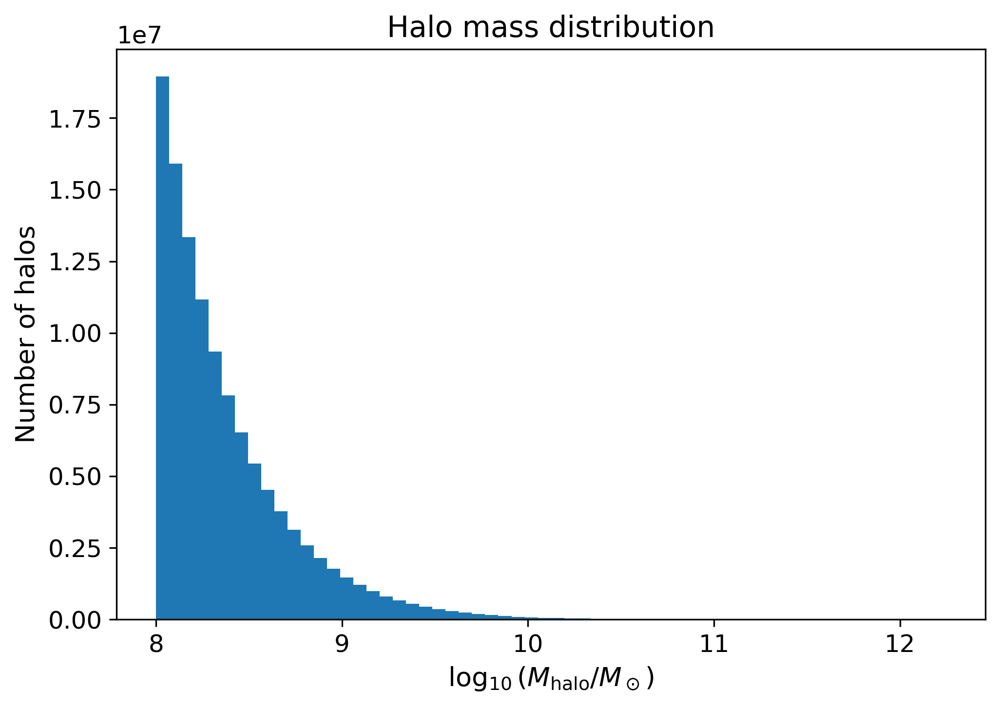


Halos in plotted slice = 3,411,722


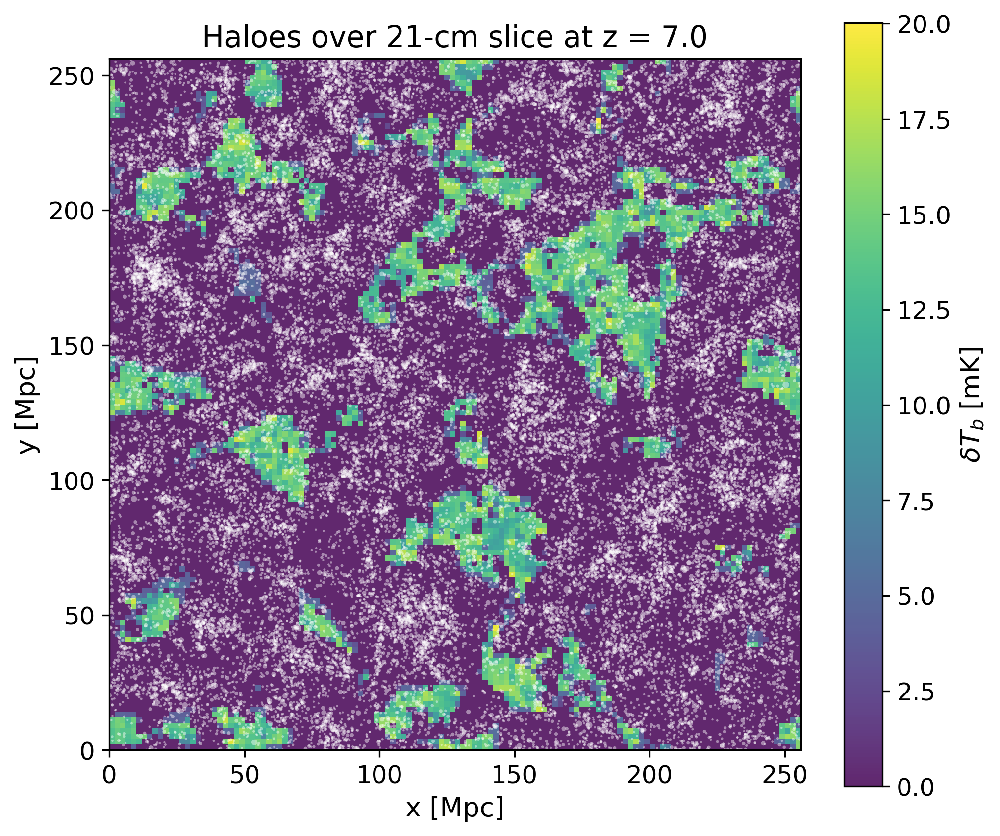

In [12]:
# ==========================================================================
# Visualise the 21cmFASTv4 halo catalogue safely
# ==========================================================================


# --------------------------------------------------------------------------
# 1. Inspect available fields
# --------------------------------------------------------------------------

print("Perturbed halo catalogue attributes:")
print([
    a for a in dir(perturbed_halos)
    if "halo" in a.lower() or "mass" in a.lower() or "sfr" in a.lower()
])

# --------------------------------------------------------------------------
# 2. Convert 21cmFAST Array objects to NumPy arrays
# --------------------------------------------------------------------------

halo_coords = np.asarray(perturbed_halos.halo_coords.value)
halo_masses = np.asarray(perturbed_halos.halo_masses.value)

print("\nCatalogue diagnostics:")
print(f"halo_coords shape = {halo_coords.shape}, dtype = {halo_coords.dtype}")
print(f"halo_masses shape = {halo_masses.shape}, dtype = {halo_masses.dtype}")
print(f"N_halos = {halo_coords.shape[0]:,}")
print(f"coord min/max = {halo_coords.min():.3f}, {halo_coords.max():.3f}")
print(f"mass min/max = {halo_masses.min():.3e}, {halo_masses.max():.3e} Msun")

# --------------------------------------------------------------------------
# 3. Subsample for plotting
# --------------------------------------------------------------------------

max_points = 50_000
rng = np.random.default_rng(42)

N_halos = halo_coords.shape[0]
plot_idx = rng.choice(
    N_halos,
    size=min(max_points, N_halos),
    replace=False,
)

halo_coords_plot = halo_coords[plot_idx]
halo_masses_plot = halo_masses[plot_idx]

# Coordinates look like grid coordinates if max ~ HII_DIM
if halo_coords.max() <= HII_DIM + 1:
    print("Interpreting halo coordinates as grid coordinates.")
    halo_pos_mpc = halo_coords_plot * (BOX_LEN / HII_DIM)
else:
    print("Interpreting halo coordinates as Mpc coordinates.")
    halo_pos_mpc = halo_coords_plot

x = halo_pos_mpc[:, 0]
y = halo_pos_mpc[:, 1]
z = halo_pos_mpc[:, 2]
m = halo_masses_plot

# --------------------------------------------------------------------------
# 4. Projected halo positions
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 6))

plt.scatter(
    x,
    y,
    s=np.clip((np.log10(m) - 7.0)**2, 1, 30),
    c=np.log10(m),
    alpha=0.5,
)

plt.colorbar(label=r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.xlabel("x [Mpc]")
plt.ylabel("y [Mpc]")
plt.title(f"Projected 21cmFAST halo catalogue at z = {z_obs}")
plt.xlim(0, BOX_LEN)
plt.ylim(0, BOX_LEN)
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# 5. Halo mass distribution
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 5))

plt.hist(
    np.log10(halo_masses[halo_masses > 0]),
    bins=60,
)

plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel("Number of halos")
plt.title("Halo mass distribution")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# 6. Halos in a thin slice over 21-cm brightness temperature
# --------------------------------------------------------------------------

slice_index = HII_DIM // 2
cell_size = BOX_LEN / HII_DIM
slice_z_mpc = slice_index * cell_size
slice_width_cells = 2
slice_width_mpc = slice_width_cells * cell_size

# For the slice, use a separate subsample to avoid huge memory use
if halo_coords.max() <= HII_DIM + 1:
    z_all_mpc = halo_coords[:, 2] * cell_size
    x_all_mpc = halo_coords[:, 0] * cell_size
    y_all_mpc = halo_coords[:, 1] * cell_size
else:
    z_all_mpc = halo_coords[:, 2]
    x_all_mpc = halo_coords[:, 0]
    y_all_mpc = halo_coords[:, 1]

in_slice = np.abs(z_all_mpc - slice_z_mpc) < slice_width_mpc
slice_indices = np.where(in_slice)[0]

print(f"\nHalos in plotted slice = {len(slice_indices):,}")

max_slice_points = 30_000
if len(slice_indices) > max_slice_points:
    slice_plot_idx = rng.choice(
        slice_indices,
        size=max_slice_points,
        replace=False,
    )
else:
    slice_plot_idx = slice_indices

plt.figure(figsize=(7, 6))

plt.imshow(
    brightness_temp_field[:, :, slice_index].T,
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
    alpha=0.85,
)

plt.colorbar(label=r"$\delta T_b$ [mK]")

plt.scatter(
    x_all_mpc[slice_plot_idx],
    y_all_mpc[slice_plot_idx],
    s=np.clip((np.log10(halo_masses[slice_plot_idx]) - 7.0)**2, 1, 30),
    c="white",
    alpha=0.45,
    edgecolors="none",
)

plt.xlabel("x [Mpc]")
plt.ylabel("y [Mpc]")
plt.title(f"Haloes over 21-cm slice at z = {z_obs}")
plt.xlim(0, BOX_LEN)
plt.ylim(0, BOX_LEN)
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()

Optional fields — sfr_mini: not populated,  fesc_sfr: not populated
Catalogue diagnostics
---------------------
N_halos = 114,291,212
SFR shape = (114291212,)
SFR finite values = 114,291,212
N halos with SFR > 0 = 114,291,212
SFR min/max = 2.153e-10 - 4.878e+02 Msun/yr
SFR median = 1.174e-05 Msun/yr


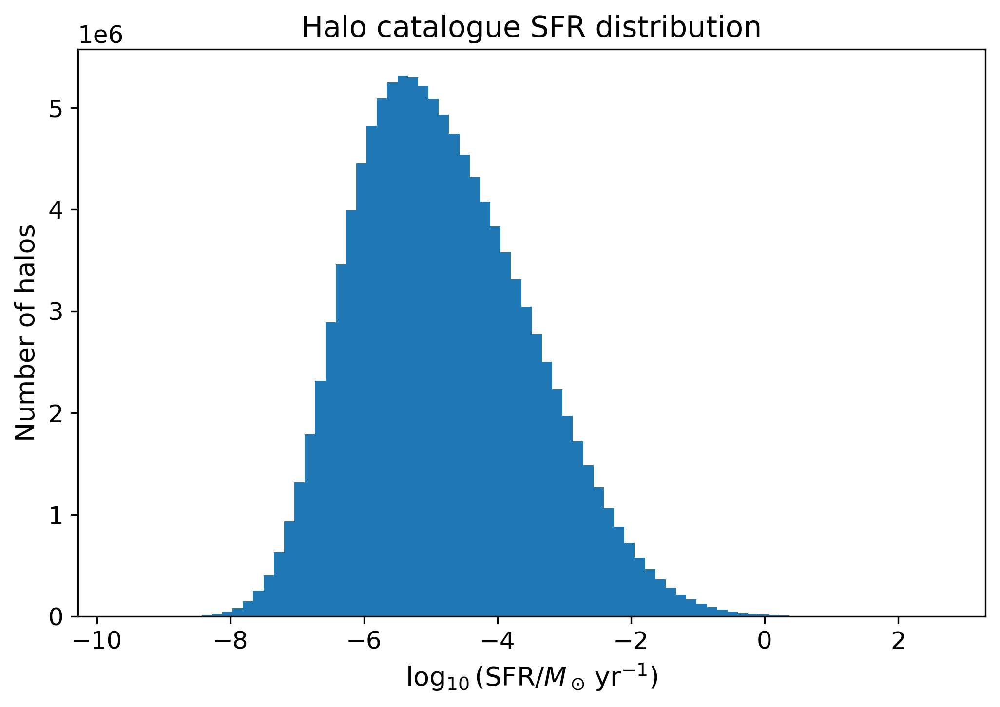

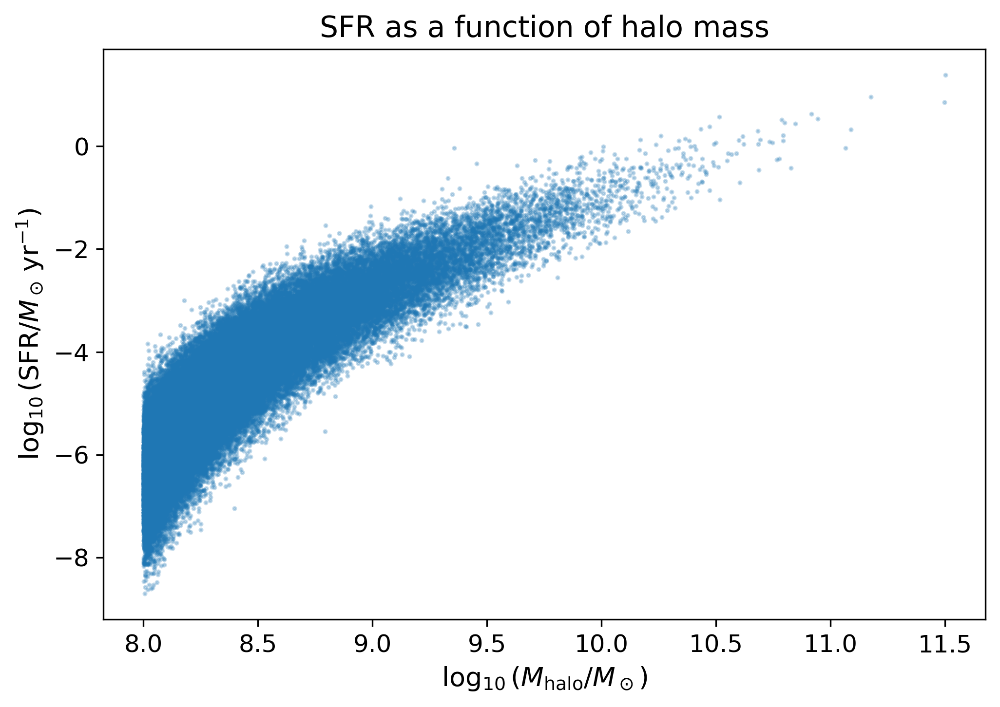

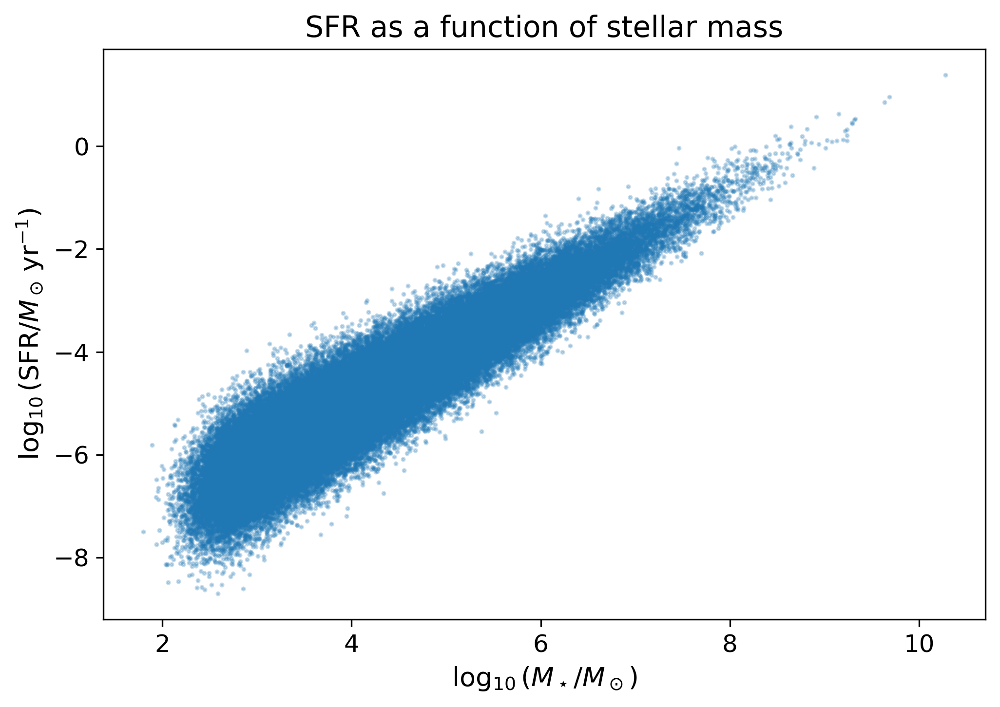

In [15]:
# ==========================================================================
# Plot SFR values from a 21cmFASTv4 PerturbedHaloCatalog
# ==========================================================================


# --------------------------------------------------------------------------
# Helper: safely extract values from 21cmFAST Array objects
# --------------------------------------------------------------------------

def get_21cmfast_array(x):
    """
    Convert a 21cmFAST Array-like object to a NumPy array.

    21cmFAST wrapper arrays often store the actual numerical data in `.value`.
    This helper handles both wrapper arrays and ordinary NumPy arrays.

    `None` is passed straight through.  py21cmfast v4 declares its *optional*
    catalogue fields as `_arrayfield(optional=True)`, i.e. `attrs.field(
    default=None)`, so a field such as `sfr_mini` always exists as an attribute
    and is None whenever the run did not fill it (no mini-halos under the
    "simple" template).  Feeding that None to `np.asarray` yields a 0-d array of
    dtype *object*, which is not None and which every ufunc rejects:

        TypeError: ufunc 'isfinite' not supported for the input types

    Returning None keeps the `is not None` guards below meaningful.
    """
    if x is None:
        return None
    if hasattr(x, "value"):
        return np.asarray(x.value)
    return np.asarray(x)


# --------------------------------------------------------------------------
# Extract halo properties
# --------------------------------------------------------------------------

halo_masses = get_21cmfast_array(perturbed_halos.halo_masses)
stellar_masses = get_21cmfast_array(perturbed_halos.stellar_masses)
sfr = get_21cmfast_array(perturbed_halos.sfr)

# py21cmfast v4 returns `perturbed_halos.sfr` in M_sun s^-1 (the internal
# C unit), NOT M_sun yr^-1 as the docs state. Convert before any UV
# calibration or literature comparison. See docs/Low_SFR_fix.md.
_SEC_PER_YR = 365.25 * 24 * 3600          # 3.15576e7 s yr^-1
sfr = np.asarray(sfr, dtype=float) * _SEC_PER_YR   # -> M_sun yr^-1

# Optional fields.
#
# `hasattr` is the wrong test here: these are attrs fields with default=None,
# so the attribute is *always* present and hasattr is unconditionally True.
# What varies is whether the run populated it.  Test the value instead.
sfr_mini = get_21cmfast_array(getattr(perturbed_halos, "sfr_mini", None))
fesc_sfr = get_21cmfast_array(getattr(perturbed_halos, "fesc_sfr", None))

# Same internal-unit correction as `sfr` above: minihalo SFR comes back in
# M_sun s^-1, and Plot 4 histograms it on the *same axes* as `sfr`, so without
# this the two distributions sit 7.5 dex apart on an axis labelled M_sun/yr.
if sfr_mini is not None:
    sfr_mini = np.asarray(sfr_mini, dtype=float) * _SEC_PER_YR   # -> M_sun yr^-1

# NOTE: `fesc_sfr` is very likely in M_sun s^-1 too, but it is plotted on its
# own axes with no unit in the label, so it is left as returned rather than
# converted on an assumption.

print(f"Optional fields — sfr_mini: {'present' if sfr_mini is not None else 'not populated'}"
      f",  fesc_sfr: {'present' if fesc_sfr is not None else 'not populated'}")

# --------------------------------------------------------------------------
# Basic diagnostics
# --------------------------------------------------------------------------

print("Catalogue diagnostics")
print("---------------------")
print(f"N_halos = {len(sfr):,}")
print(f"SFR shape = {sfr.shape}")
print(f"SFR finite values = {np.isfinite(sfr).sum():,}")

positive_sfr = sfr[np.isfinite(sfr) & (sfr > 0)]

print(f"N halos with SFR > 0 = {len(positive_sfr):,}")
print(f"SFR min/max = {positive_sfr.min():.3e} - {positive_sfr.max():.3e} Msun/yr")
print(f"SFR median = {np.median(positive_sfr):.3e} Msun/yr")

# --------------------------------------------------------------------------
# Subsample for scatter plots if catalogue is huge
# --------------------------------------------------------------------------

max_points = 100_000
rng = np.random.default_rng(42)

valid = (
    np.isfinite(halo_masses)
    & np.isfinite(stellar_masses)
    & np.isfinite(sfr)
    & (halo_masses > 0)
    & (stellar_masses > 0)
    & (sfr > 0)
)

valid_idx = np.where(valid)[0]

if len(valid_idx) > max_points:
    plot_idx = rng.choice(valid_idx, size=max_points, replace=False)
else:
    plot_idx = valid_idx

# ==========================================================================
# Plot 1: SFR histogram
# ==========================================================================

plt.figure(figsize=(7, 5))

plt.hist(
    np.log10(positive_sfr),
    bins=80,
)

plt.xlabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
plt.ylabel("Number of halos")
plt.title("Halo catalogue SFR distribution")
plt.tight_layout()
plt.show()

# ==========================================================================
# Plot 2: SFR vs halo mass
# ==========================================================================

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(halo_masses[plot_idx]),
    np.log10(sfr[plot_idx]),
    s=2,
    alpha=0.25,
)

plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
plt.title("SFR as a function of halo mass")
plt.tight_layout()
plt.show()

# ==========================================================================
# Plot 3: SFR vs stellar mass
# ==========================================================================

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(stellar_masses[plot_idx]),
    np.log10(sfr[plot_idx]),
    s=2,
    alpha=0.25,
)

plt.xlabel(r"$\log_{10}(M_\star/M_\odot)$")
plt.ylabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
plt.title("SFR as a function of stellar mass")
plt.tight_layout()
plt.show()

# ==========================================================================
# Plot 4: Optional comparison with minihalo SFR
# ==========================================================================

if sfr_mini is not None:
    valid_mini = np.isfinite(sfr_mini) & (sfr_mini > 0)

    if valid_mini.any():
        plt.figure(figsize=(7, 5))

        plt.hist(
            np.log10(sfr[np.isfinite(sfr) & (sfr > 0)]),
            bins=80,
            alpha=0.6,
            label="sfr",
        )

        plt.hist(
            np.log10(sfr_mini[valid_mini]),
            bins=80,
            alpha=0.6,
            label="sfr_mini",
        )

        plt.xlabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
        plt.ylabel("Number of halos")
        plt.title("SFR and minihalo SFR distributions")
        plt.legend()
        plt.tight_layout()
        plt.show()

# ==========================================================================
# Plot 5: Optional fesc-weighted SFR
# ==========================================================================

if fesc_sfr is not None:
    valid_fesc = np.isfinite(fesc_sfr) & (fesc_sfr > 0)

    if valid_fesc.any():
        plt.figure(figsize=(7, 5))

        plt.hist(
            np.log10(fesc_sfr[valid_fesc]),
            bins=80,
        )

        plt.xlabel(r"$\log_{10}(f_{\rm esc}\,\mathrm{SFR})$")
        plt.ylabel("Number of halos")
        plt.title(r"Escape-fraction-weighted SFR distribution")
        plt.tight_layout()
        plt.show()

## 3  Construct the galaxy density field

### 3a  From the 21cmFASTv4 lightcone halobox

The lightcone stores `halo_sfr`: the per-cell SFR density integrated over all halos,
evaluated at each LOS slice. This naturally traces UV-bright galaxies as in the
coeval case, but now evolves continuously along the line of sight.

### 3b  Synthetic fallback

If 21cmFAST is unavailable, a biased Poisson-sampled galaxy field is generated
from the density field, anti-correlated with the 21 cm signal.

In [16]:
cell_volume = cell_size**3

if HAS_21CMFAST:
    print("Constructing galaxy density field from lightcone halobox …")

    sfr_field = lightcone.lightcones["halo_sfr"]   # (HII_DIM, HII_DIM, N_z)

    mean_sfr = sfr_field.mean()
    if mean_sfr > 0:
        galaxy_overdensity = sfr_field / mean_sfr - 1.0
    else:
        galaxy_overdensity = np.zeros_like(sfr_field)

    print(f"  SFR density  : [{sfr_field.min():.2e}, {sfr_field.max():.2e}] (internal units)")
    print(f"  Galaxy δ     : [{galaxy_overdensity.min():.2f}, {galaxy_overdensity.max():.2f}]")
    print(f"  Shot-noise n̄ : {mean_galaxy_density:.2e} h³ Mpc⁻³  (survey parameter)")

else:
    print("Generating synthetic galaxy field …")

    expected_counts = (
        mean_galaxy_density
        * cell_volume
        * np.exp(galaxy_bias * density_field)
        * (1.0 - neutral_fraction)
    )
    galaxy_counts      = np.random.poisson(np.clip(expected_counts, 0, 50)).astype(float)
    mean_count         = galaxy_counts.mean()
    galaxy_overdensity = galaxy_counts / max(mean_count, 1e-10) - 1.0

    print(f"Mean galaxy density : {mean_count / cell_volume:.2e} h³ Mpc⁻³")
    print(f"Total galaxies      : {int(galaxy_counts.sum())}")

Constructing galaxy density field from lightcone halobox …
  SFR density  : [0.00e+00, 1.47e-06] (internal units)
  Galaxy δ     : [-1.00, 2265.61]
  Shot-noise n̄ : 3.00e-03 h³ Mpc⁻³  (survey parameter)


In [17]:
# ==========================================================================
# Analytic galaxy bias from the halo mass function
#
# This mirrors run_simulation.py §4 ("Fallback / cross-check: analytic HMF
# integral").  Every conversion is imported from src/ — see cell 1.
#
# NOTE ON WHICH ESTIMATE IS ADOPTED.  The pipeline computes b_g two ways and
# prefers the *halo catalogue* estimate (select_euclid_halos +
# effective_galaxy_bias), because it carries 21cmFAST's log-normal SFR
# scatter.  This analytic integral is the scatter-free cross-check and runs
# over the mean M_star(M_h) relation, so it sits systematically higher.  It is
# adopted here only because the catalogue selection below returns no halos.
# ==========================================================================

from hmf import MassFunction
from scipy.integrate import simpson

# --------------------------------------------------------------------------
# Euclid absolute UV magnitude limits (more negative = brighter)
# --------------------------------------------------------------------------
# M_UV_bright / M_UV_faint come from the CONFIGURATION cell so that the bias
# integral below is evaluated over exactly the sample selected in the
# UV-selection cell. Do not redefine them here.

L_UV_min = Muv_to_Luv(M_UV_faint)    # faint limit
L_UV_max = Muv_to_Luv(M_UV_bright)   # bright limit

print(f"L_UV range = {L_UV_min:.3e} - {L_UV_max:.3e} erg s^-1 Hz^-1")

# --------------------------------------------------------------------------
# 21cmFAST-like mean stellar-halo relation
# --------------------------------------------------------------------------

F_STAR10   = 0.05
ALPHA_STAR = 0.5
M_TURN     = 5e8

OMEGA_B_0 = 0.049
# OMEGA_M_0 comes from the CONFIGURATION cell — do not redefine it here.

t_sf_yr = star_formation_timescale(
    z_obs, t_star=T_STAR_DEFAULT,
    hubble_constant=HUBBLE_CONSTANT, omega_m=OMEGA_M_0,
)
print(f"Star-formation timescale: t_sf = t_STAR × t_H(z_obs)"
      f" = {T_STAR_DEFAULT} × {t_sf_yr / T_STAR_DEFAULT / 1e9:.3f} Gyr"
      f" = {t_sf_yr / 1e6:.1f} Myr")


def f_star(M_h):
    """Stellar fraction f_*(M_h) with exponential turnover below M_TURN."""
    return F_STAR10 * (M_h / 1e10)**ALPHA_STAR * np.exp(-M_TURN / M_h)


def stellar_mass_model(M_h):
    """Mean stellar mass for a halo of mass M_h [Msun]."""
    return f_star(M_h) * (OMEGA_B_0 / OMEGA_M_0) * M_h


def sfr_model(M_h):
    """
    Mean SFR [Msun/yr] using 21cmFAST's OWN star-formation timescale.

    t_sf = t_STAR * t_H(z) ≈ 570 Myr at z = 7 — not the 100 Myr that was
    hardcoded here previously, which overestimated every SFR by 5.7× and so
    made every galaxy 1.89 magnitudes too bright.
    """
    return stellar_mass_to_sfr(
        stellar_mass_model(M_h), z=z_obs, t_star=T_STAR_DEFAULT,
        hubble_constant=HUBBLE_CONSTANT, omega_m=OMEGA_M_0,
    )


def uv_luminosity(M_h):
    """
    Mean UV luminosity [erg s^-1 Hz^-1] (Madau & Dickinson 2014).

    L_UV = SFR / kappa_UV with kappa_UV = 1.15e-28, i.e. SFR × 8.696e27 —
    not SFR × 1.15e28, which was 1.32× too luminous.
    """
    return sfr_to_Luv(sfr_model(M_h))


# --------------------------------------------------------------------------
# Halo mass function
# --------------------------------------------------------------------------

mf = MassFunction(
    z=z_obs,
    Mmin=7,
    Mmax=13,
    dlog10m=0.02,
)

M_h       = mf.m          # [Msun/h]  — see the caveat printed below
dndlog10m = mf.dndlog10m  # [h^3 Mpc^-3 dex^-1]

# --------------------------------------------------------------------------
# Halo bias: Sheth-Tormen (1999), from the SQUARED peak height
# --------------------------------------------------------------------------
# hmf stores MassFunction.nu as nu_sq = (delta_c / sigma)^2 — already squared.
# src.conversions.sheth_tormen_bias expects exactly that and uses `a * nu_sq`
# internally.  The local helper this cell used to define squared it a second
# time (`a * nu**2` = nu^4), which inflated b_h by ~9x at nu_sq = 10 and is
# what produced the implausible b_g ≈ 33.
halo_bias = sheth_tormen_bias(mf.nu)

# --------------------------------------------------------------------------
# Euclid selection on the mean relation
# --------------------------------------------------------------------------
# Named selected_mass_bins, not `selected`: the UV-selection cell below uses
# `selected` for its per-halo catalogue mask, and the two are different things.

# Named L_UV_model, not L_UV: the UV-selection cells below use L_UV for the
# per-halo catalogue array.  Binding the 300-element mass-bin array to that
# name here would silently corrupt them if this cell is ever re-run after
# them - which is exactly what happens when the M_UV limits are being tuned.
L_UV_model = uv_luminosity(M_h)

selected_mass_bins = (L_UV_model >= L_UV_min) & (L_UV_model <= L_UV_max)

if selected_mass_bins.sum() < 2:
    raise RuntimeError(
        "Too few halo mass bins satisfy the luminosity selection. "
        "Check M_UV limits or the stellar-halo/SFR parameters."
    )

# --------------------------------------------------------------------------
# Effective galaxy number density and bias
# --------------------------------------------------------------------------

logM = np.log10(M_h)

n_gal = simpson(
    dndlog10m[selected_mass_bins],
    x=logM[selected_mass_bins],
)

galaxy_bias_hmf = simpson(
    dndlog10m[selected_mass_bins] * halo_bias[selected_mass_bins],
    x=logM[selected_mass_bins],
) / n_gal

# Adopted value — consumed by the Kaiser RSD cell below.
galaxy_bias = galaxy_bias_hmf

print(f"n_gal = {n_gal:.3e} h^3 Mpc^-3")
print(f"Estimated Euclid galaxy bias = {galaxy_bias:.2f}")
print(
    f"Selected halo mass range: "
    f"{M_h[selected_mass_bins].min():.2e} - "
    f"{M_h[selected_mass_bins].max():.2e} Msun/h"
    f"  ({selected_mass_bins.sum()} of {M_h.size} bins)"
)

# --------------------------------------------------------------------------
# Caveats carried over from run_simulation.py §4 — not bugs introduced here,
# but read them before quoting these numbers.
# --------------------------------------------------------------------------
print("\nCaveats:")
print("  • hmf works in Msun/h and h^3 Mpc^-3; the stellar-halo relation above")
print("    treats M_h as Msun. Consistent with run_simulation.py, but both")
print("    inherit the same h-factor ambiguity.")
print("  • MassFunction() uses hmf's default cosmology, not this notebook's")
print("    HUBBLE_CONSTANT / OMEGA_M_0.")
print("  • This is the scatter-free estimate; the catalogue estimate that the")
print("    pipeline prefers is lower, because 21cmFAST's log-normal SFR")
print("    scatter pulls fainter halos into the magnitude window.")
print(f"  • outputs/lightcone_data.h5 stores galaxy_bias = 33.389 from an")
print(f"    earlier, buggy version of this cell. The stored galaxy_overdensity")
print(f"    field was built with that Kaiser boost, so the attribute correctly")
print(f"    describes the stored field and was deliberately NOT patched.")
print(f"    Regenerate with --sim force to propagate b_g = {galaxy_bias:.2f}.")

L_UV range = 6.918e+27 - 5.058e+29 erg s^-1 Hz^-1
Star-formation timescale: t_sf = t_STAR × t_H(z_obs) = 0.5 × 1.141 Gyr = 570.3 Myr
n_gal = 2.394e-03 h^3 Mpc^-3
Estimated Euclid galaxy bias = 5.39
Selected halo mass range: 3.31e+10 - 5.50e+11 Msun/h  (62 of 300 bins)

Caveats:
  • hmf works in Msun/h and h^3 Mpc^-3; the stellar-halo relation above
    treats M_h as Msun. Consistent with run_simulation.py, but both
    inherit the same h-factor ambiguity.
  • MassFunction() uses hmf's default cosmology, not this notebook's
    HUBBLE_CONSTANT / OMEGA_M_0.
  • This is the scatter-free estimate; the catalogue estimate that the
    pipeline prefers is lower, because 21cmFAST's log-normal SFR
    scatter pulls fainter halos into the magnitude window.
  • outputs/lightcone_data.h5 stores galaxy_bias = 33.389 from an
    earlier, buggy version of this cell. The stored galaxy_overdensity
    field was built with that Kaiser boost, so the attribute correctly
    describes the stored field and 

UV luminosity diagnostics
-------------------------
N halos total       = 114,291,212
N halos with SFR>0  = 114,291,212
SFR range           = 2.153e-10 - 4.878e+02 M_sun/yr
L_UV range          = 1.872e+18 - 4.242e+30 erg/s/Hz
M_UV range          = -24.97 - 5.92

Coordinate diagnostics
----------------------
coords min/max = 0.000, 256.000
BOX_LEN        = 256.0
HII_DIM        = 128


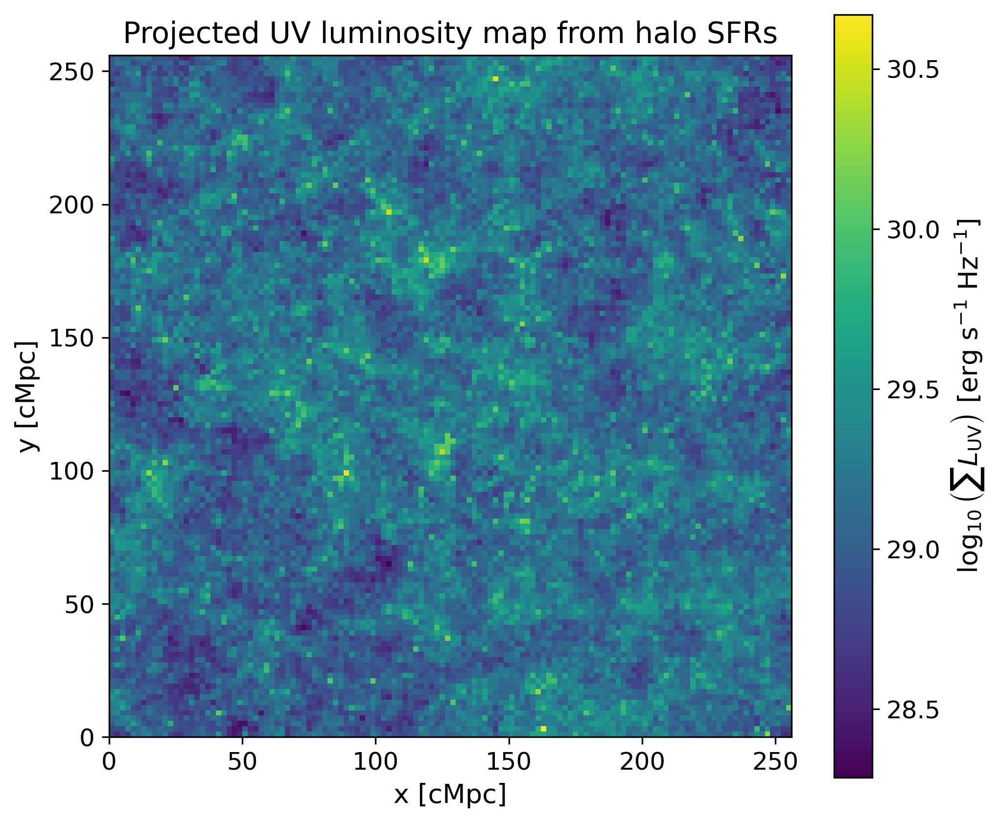

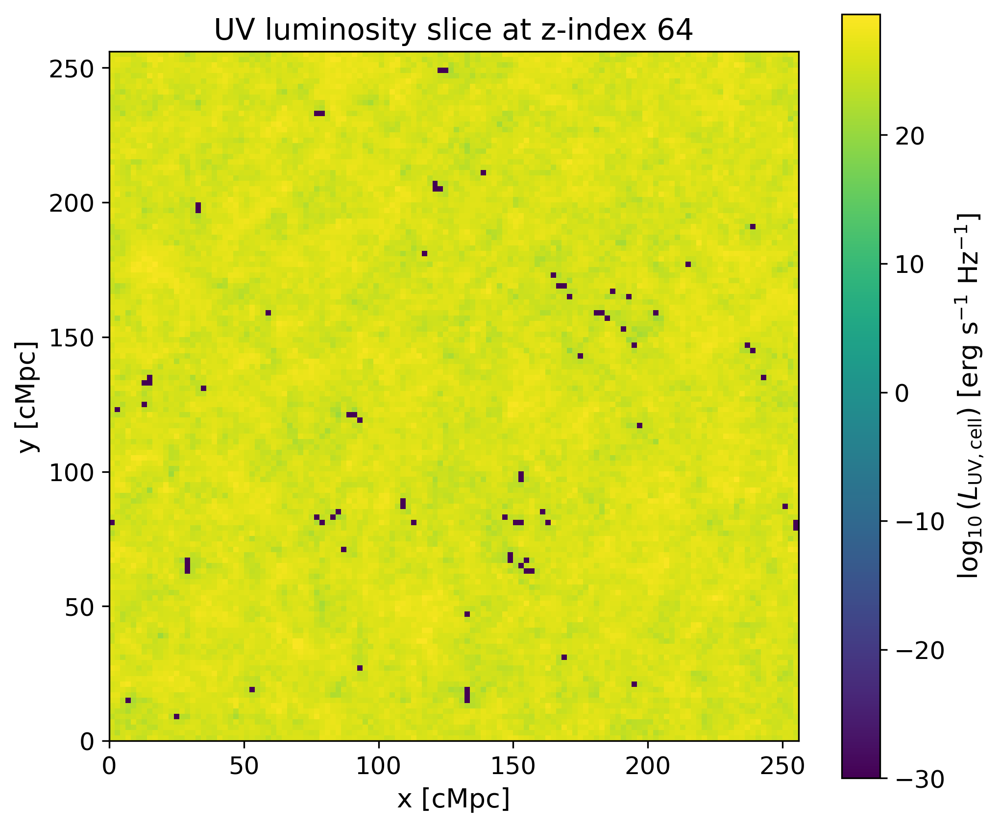

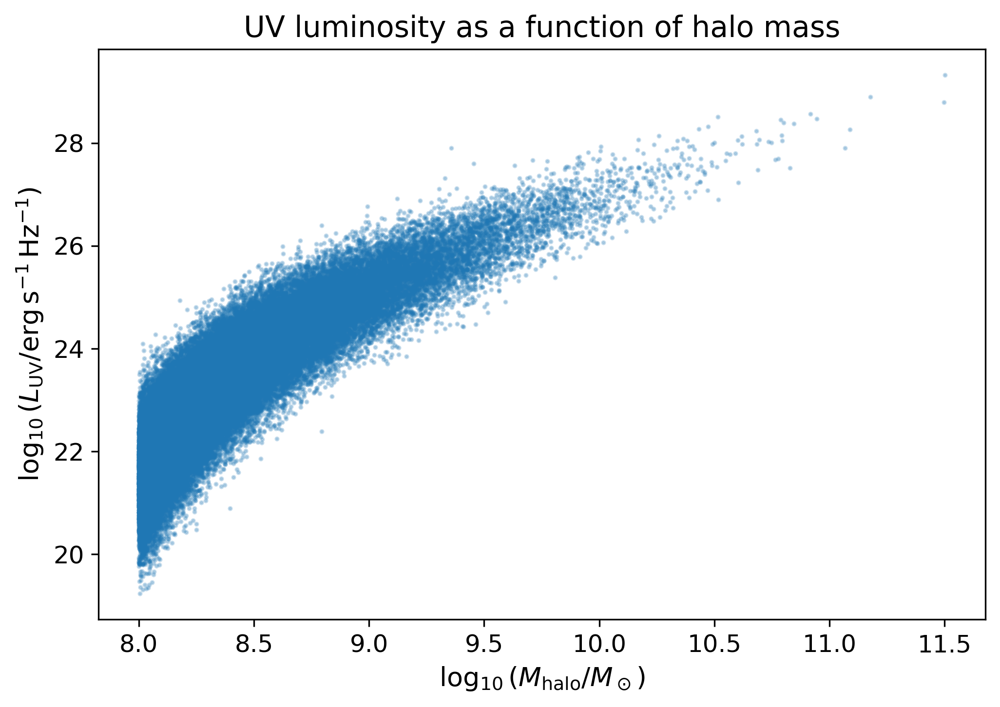

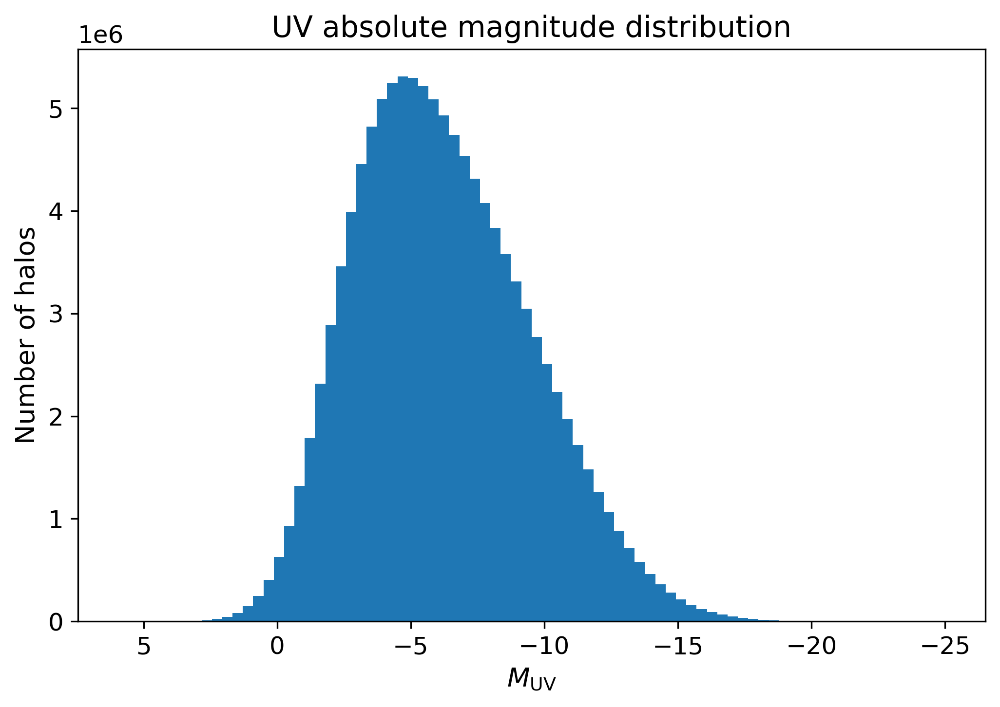

In [18]:
# ==========================================================================
# Convert halo SFRs to UV luminosities and plot UV luminosity map
# ==========================================================================


# --------------------------------------------------------------------------
# Helper for 21cmFAST Array objects
# --------------------------------------------------------------------------

# `get_21cmfast_array` is defined once, in the halo-catalogue cell above.

# --------------------------------------------------------------------------
# Extract halo catalogue quantities
# --------------------------------------------------------------------------

halo_coords = get_21cmfast_array(perturbed_halos.halo_coords)
halo_masses = get_21cmfast_array(perturbed_halos.halo_masses)
sfr = get_21cmfast_array(perturbed_halos.sfr)

# py21cmfast v4 returns `perturbed_halos.sfr` in M_sun s^-1 (the internal
# C unit), NOT M_sun yr^-1 as the docs state. Convert before any UV
# calibration or literature comparison. See docs/Low_SFR_fix.md.
_SEC_PER_YR = 365.25 * 24 * 3600          # 3.15576e7 s yr^-1
sfr = np.asarray(sfr, dtype=float) * _SEC_PER_YR   # -> M_sun yr^-1

# Clean SFR values
sfr[~np.isfinite(sfr)] = 0.0
sfr[sfr < 0] = 0.0

# --------------------------------------------------------------------------
# SFR -> UV luminosity
# --------------------------------------------------------------------------
# Uses the project-wide Madau & Dickinson (2014) calibration
# (kappa_UV = 1.15e-28, Chabrier IMF) from src/conversions.py, so the
# notebook cannot drift from run_simulation.py and the analysis notebooks.
# To compare against Kennicutt (1998, Salpeter), pass kappa_uv=1.4e-28.

L_UV = sfr_to_Luv(sfr)  # erg s^-1 Hz^-1

# AB absolute magnitude corresponding to L_nu
# M_AB = -2.5 log10(L_nu) + 51.60

M_UV = np.full_like(L_UV, np.inf, dtype=float)

positive_lum = L_UV > 0
M_UV[positive_lum] = -2.5 * np.log10(L_UV[positive_lum]) + 51.60

print("UV luminosity diagnostics")
print("-------------------------")
print(f"N halos total       = {len(sfr):,}")
print(f"N halos with SFR>0  = {(sfr > 0).sum():,}")
print(f"SFR range           = {sfr[sfr > 0].min():.3e} - {sfr.max():.3e} M_sun/yr")
print(f"L_UV range          = {L_UV[L_UV > 0].min():.3e} - {L_UV.max():.3e} erg/s/Hz")
print(f"M_UV range          = {np.nanmin(M_UV[np.isfinite(M_UV)]):.2f} - {np.nanmax(M_UV[np.isfinite(M_UV)]):.2f}")


# --------------------------------------------------------------------------
# Convert halo coordinates to grid indices
# --------------------------------------------------------------------------
# Assumption:
#   halo_coords are comoving positions in Mpc inside a box of side BOX_LEN.
#
# If your coordinates are instead grid coordinates, this still works when
# BOX_LEN == HII_DIM, but check the printed diagnostics.

coords = np.asarray(halo_coords, dtype=float)

print("\nCoordinate diagnostics")
print("----------------------")
print(f"coords min/max = {coords.min():.3f}, {coords.max():.3f}")
print(f"BOX_LEN        = {BOX_LEN:.2f}")
print(f"HII_DIM        = {HII_DIM}")

# The catalogue is COEVAL, not a lightcone: perturb_halo_catalog() acts on the
# coeval initial-conditions box, so coords span [0, BOX_LEN) on all three
# axes and the grid below is genuinely cubic.  This is *not* the
# (HII_DIM, HII_DIM, N_z) lightcone shape used for the power spectra in S4 --
# these grids feed the diagnostic maps in this cell and the next one only.
outside = ((coords < 0.0) | (coords > BOX_LEN)).any(axis=1).sum()
if outside:
    print(f"WARNING: {outside:,} halos lie outside [0, BOX_LEN] and are dropped")


# --------------------------------------------------------------------------
# Paint UV luminosity into a 3D grid
# --------------------------------------------------------------------------
# luminosity_grid[x, y, z] = sum of L_UV from halos in that cell.
# deposit_halo_field() is imported from src.analysis rather than reimplemented
# here, so this map and run_pipeline.py's galaxy field share one binning.

luminosity_grid = deposit_halo_field(
    coords, box_len=BOX_LEN, n_perp=HII_DIM, weights=L_UV,
)

# A luminosity *density* field is one division away, but a full
# (HII_DIM, HII_DIM, HII_DIM) copy costs ~134 MB at HII_DIM = 256 and nothing
# below reads it, so it is not materialised:
#     luminosity_density_grid = luminosity_grid / cell_volume
cell_volume = cell_size**3  # Mpc^3
print(f"Total L_UV on grid  = {luminosity_grid.sum():.3e} erg s^-1 Hz^-1")
print(f"Mean L_UV density   = {luminosity_grid.mean() / cell_volume:.3e} "
      f"erg s^-1 Hz^-1 Mpc^-3")


# --------------------------------------------------------------------------
# Plot 1: projected luminosity map
# --------------------------------------------------------------------------
# Sum along the z-axis to produce a 2D projected map.

projected_L_UV = luminosity_grid.sum(axis=2)

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(projected_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(label=r"$\log_{10}\left(\sum L_{\rm UV}\right)$ [erg s$^{-1}$ Hz$^{-1}$]")
plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title("Projected UV luminosity map from halo SFRs")
plt.tight_layout()
plt.show()


# --------------------------------------------------------------------------
# Plot 2: thin slice luminosity map
# --------------------------------------------------------------------------

slice_index = HII_DIM // 2

slice_L_UV = luminosity_grid[:, :, slice_index]

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(slice_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(label=r"$\log_{10}(L_{\rm UV, cell})$ [erg s$^{-1}$ Hz$^{-1}$]")
plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(f"UV luminosity slice at z-index {slice_index}")
plt.tight_layout()
plt.show()


# --------------------------------------------------------------------------
# Plot 3: halo UV luminosity versus halo mass
# --------------------------------------------------------------------------

valid = (
    np.isfinite(halo_masses)
    & np.isfinite(L_UV)
    & (halo_masses > 0)
    & (L_UV > 0)
)

max_points = 100_000
rng = np.random.default_rng(42)
valid_idx = np.where(valid)[0]

if len(valid_idx) > max_points:
    plot_idx = rng.choice(valid_idx, size=max_points, replace=False)
else:
    plot_idx = valid_idx

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(halo_masses[plot_idx]),
    np.log10(L_UV[plot_idx]),
    s=2,
    alpha=0.25,
)

plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel(r"$\log_{10}(L_{\rm UV}/{\rm erg\,s^{-1}\,Hz^{-1}})$")
plt.title("UV luminosity as a function of halo mass")
plt.tight_layout()
plt.show()


# --------------------------------------------------------------------------
# Plot 4: UV absolute magnitude distribution
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 5))

plt.hist(
    M_UV[np.isfinite(M_UV)],
    bins=80,
)

plt.gca().invert_xaxis()
plt.xlabel(r"$M_{\rm UV}$")
plt.ylabel("Number of halos")
plt.title("UV absolute magnitude distribution")
plt.tight_layout()
plt.show()

Euclid-like UV selection
-----------------------
M_UV range selected : -22.66 <= M_UV <= -18.0
Selected halos      : 49,536 / 114,291,212
Selected fraction   : 4.334e-04
Selected L_UV range : 6.919e+27 - 5.003e+29 erg/s/Hz
Selected SFR range  : 7.956e-01 - 5.754e+01 M_sun/yr
Selected M_UV range : -22.65 - -18.00
Mean selected count per cell = 2.362e-02
Total selected galaxies      = 49536


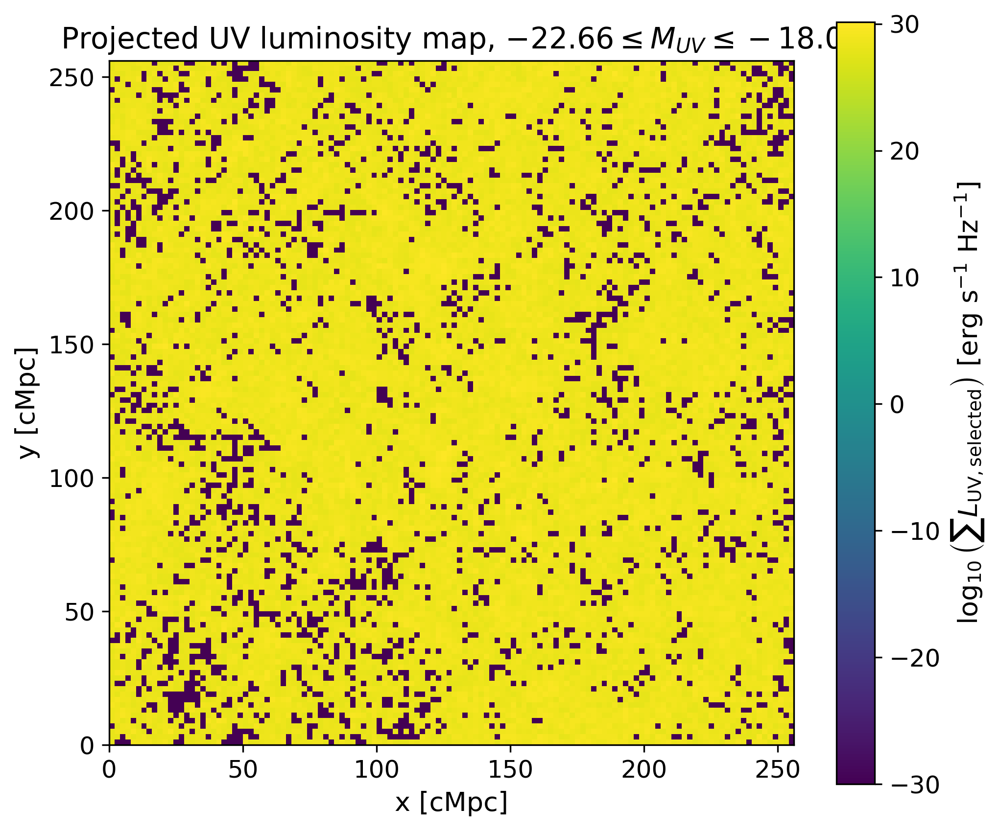

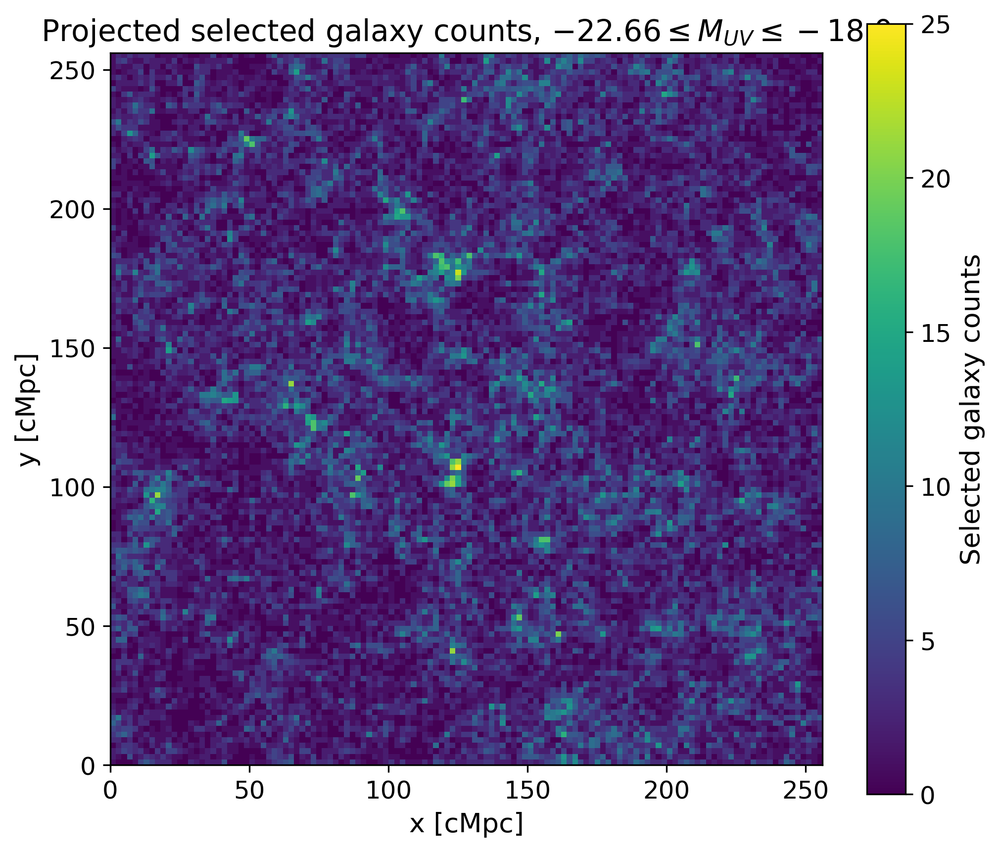

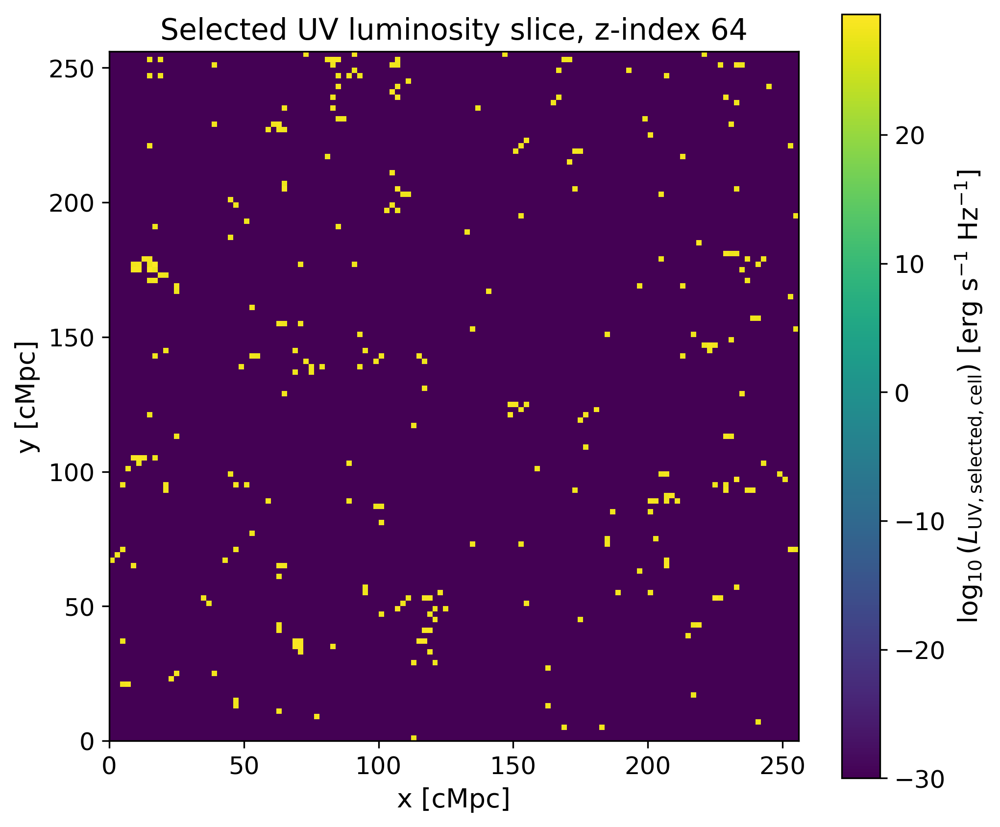

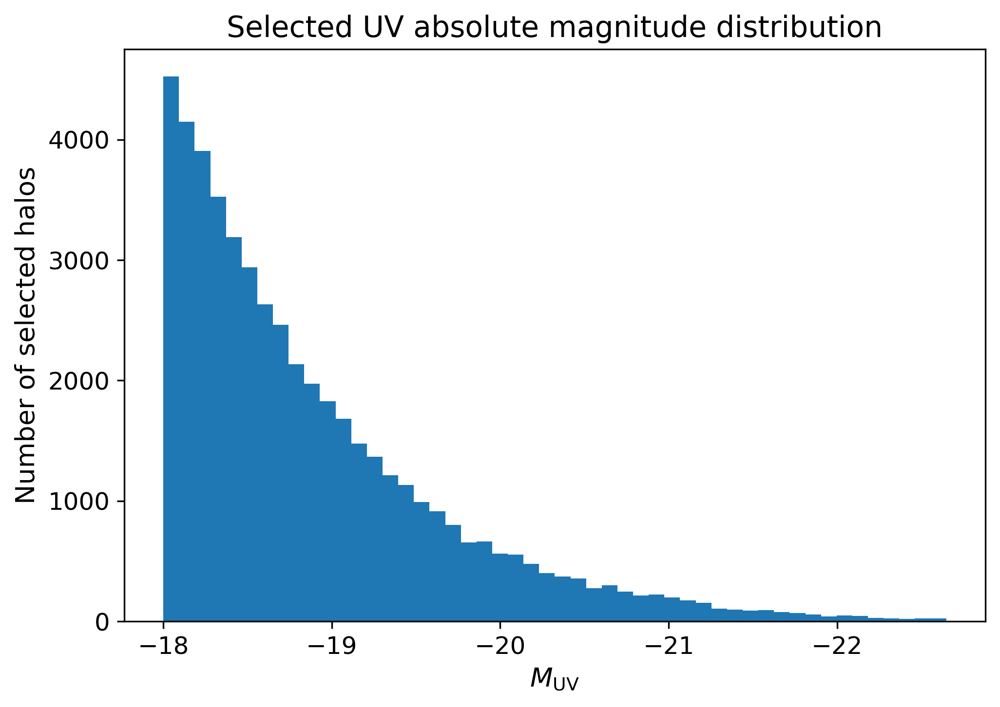

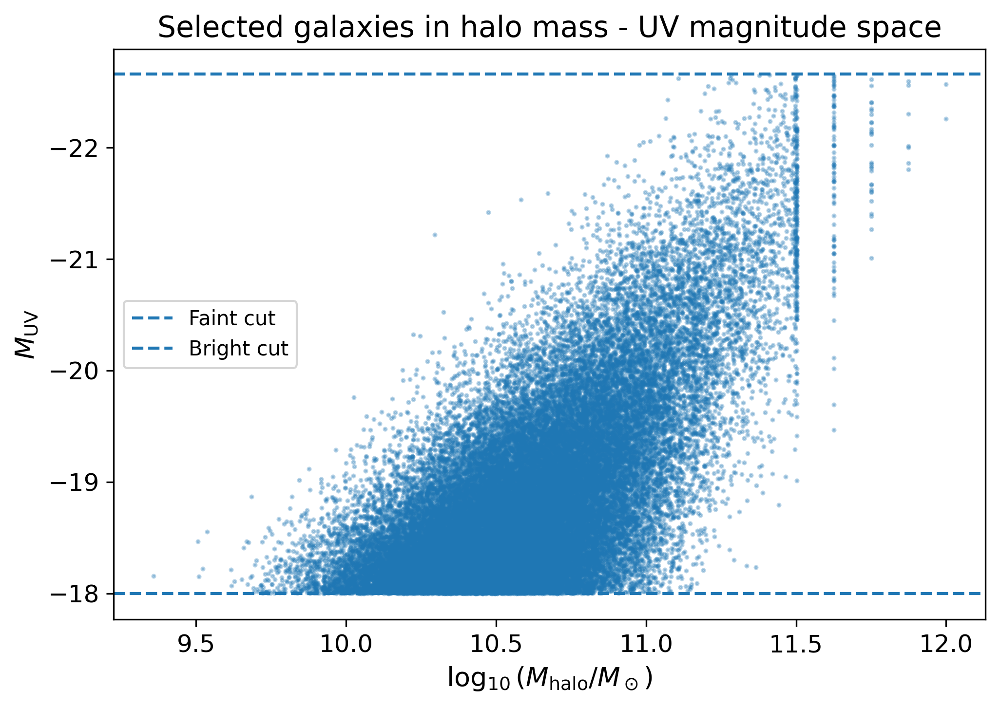

In [19]:
# ==========================================================================
# Apply Euclid-like UV magnitude selection and plot selected luminosity map
# ==========================================================================


# --------------------------------------------------------------------------
# Magnitude cuts
# --------------------------------------------------------------------------
# More negative M_UV = brighter. Selects galaxies with
#     M_UV_bright <= M_UV <= M_UV_faint
# using the cuts set in the CONFIGURATION cell.

selected = (
    np.isfinite(M_UV)
    & (M_UV >= M_UV_bright)
    & (M_UV <= M_UV_faint)
    & (L_UV > 0)
)

print("Euclid-like UV selection")
print("-----------------------")
print(f"M_UV range selected : {M_UV_bright} <= M_UV <= {M_UV_faint}")
print(f"Selected halos      : {selected.sum():,} / {len(M_UV):,}")
print(f"Selected fraction   : {selected.mean():.3e}")

if selected.sum() == 0:
    raise RuntimeError("No halos pass the M_UV selection. Check SFR calibration or magnitude limits.")

print(f"Selected L_UV range : {L_UV[selected].min():.3e} - {L_UV[selected].max():.3e} erg/s/Hz")
print(f"Selected SFR range  : {sfr[selected].min():.3e} - {sfr[selected].max():.3e} M_sun/yr")
print(f"Selected M_UV range : {M_UV[selected].min():.2f} - {M_UV[selected].max():.2f}")

# --------------------------------------------------------------------------
# Paint only selected galaxies into the 3D grid
# --------------------------------------------------------------------------

# Same cubic coeval grid as the cell above, via the same src.analysis helper.
# Only the selected halos are deposited, weighted by L_UV and by unit counts.

selected_luminosity_grid = deposit_halo_field(
    coords[selected], box_len=BOX_LEN, n_perp=HII_DIM, weights=L_UV[selected],
)
selected_counts_grid = deposit_halo_field(
    coords[selected], box_len=BOX_LEN, n_perp=HII_DIM,
)

cell_volume = (BOX_LEN / HII_DIM) ** 3
mean_selected_count = selected_counts_grid.mean()

# NOTE: the selected-catalogue overdensity is deliberately NOT built here.
# delta_gal for the power spectra comes from the lightcone halo_sfr field in
# S3 -- shape (HII_DIM, HII_DIM, N_z) -- and mixing in a cubic coeval field
# would be a shape and geometry mismatch.  The commented form below is the
# coeval-only diagnostic, and was previously computed but never read:
#     selected_galaxy_overdensity = selected_counts_grid / mean_selected_count - 1.0
# Likewise selected_luminosity_density_grid = selected_luminosity_grid / cell_volume.

print(f"Mean selected count per cell = {mean_selected_count:.3e}")
print(f"Total selected galaxies      = {selected_counts_grid.sum():.0f}")
print(f"Mean selected L_UV density   = "
      f"{selected_luminosity_grid.mean() / cell_volume:.3e} erg s^-1 Hz^-1 Mpc^-3")

# --------------------------------------------------------------------------
# Plot 1: projected selected UV luminosity map
# --------------------------------------------------------------------------

projected_selected_L_UV = selected_luminosity_grid.sum(axis=2)

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(projected_selected_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(
    label=r"$\log_{10}\left(\sum L_{\rm UV, selected}\right)$ [erg s$^{-1}$ Hz$^{-1}$]"
)

plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(rf"Projected UV luminosity map, ${M_UV_bright} \leq M_{{UV}} \leq {M_UV_faint}$")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 2: projected selected galaxy count map
# --------------------------------------------------------------------------

projected_selected_counts = selected_counts_grid.sum(axis=2)

plt.figure(figsize=(7, 6))

plt.imshow(
    projected_selected_counts.T,
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(label="Selected galaxy counts")
plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(rf"Projected selected galaxy counts, ${M_UV_bright} \leq M_{{UV}} \leq {M_UV_faint}$")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 3: thin-slice selected UV luminosity map
# --------------------------------------------------------------------------

slice_index = HII_DIM // 2
slice_selected_L_UV = selected_luminosity_grid[:, :, slice_index]

plt.figure(figsize=(7, 6))

plt.imshow(
    np.log10(slice_selected_L_UV.T + 1e-30),
    origin="lower",
    extent=[0, BOX_LEN, 0, BOX_LEN],
    interpolation="nearest",
)

plt.colorbar(
    label=r"$\log_{10}(L_{\rm UV, selected, cell})$ [erg s$^{-1}$ Hz$^{-1}$]"
)

plt.xlabel("x [cMpc]")
plt.ylabel("y [cMpc]")
plt.title(rf"Selected UV luminosity slice, z-index {slice_index}")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 4: selected M_UV distribution
# --------------------------------------------------------------------------

plt.figure(figsize=(7, 5))

plt.hist(
    M_UV[selected],
    bins=50,
)

plt.gca().invert_xaxis()
plt.xlabel(r"$M_{\rm UV}$")
plt.ylabel("Number of selected halos")
plt.title("Selected UV absolute magnitude distribution")
plt.tight_layout()
plt.show()

# --------------------------------------------------------------------------
# Plot 5: selected UV luminosity vs halo mass
# --------------------------------------------------------------------------

valid_selected = (
    selected
    & np.isfinite(halo_masses)
    & (halo_masses > 0)
    & np.isfinite(L_UV)
    & (L_UV > 0)
)

valid_idx = np.where(valid_selected)[0]

max_points = 100_000
rng = np.random.default_rng(42)

if len(valid_idx) > max_points:
    plot_idx = rng.choice(valid_idx, size=max_points, replace=False)
else:
    plot_idx = valid_idx

plt.figure(figsize=(7, 5))

plt.scatter(
    np.log10(halo_masses[plot_idx]),
    M_UV[plot_idx],
    s=2,
    alpha=0.3,
)

plt.axhline(M_UV_faint, linestyle="--", label="Faint cut")
plt.axhline(M_UV_bright, linestyle="--", label="Bright cut")

plt.gca().invert_yaxis()
plt.xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
plt.ylabel(r"$M_{\rm UV}$")
plt.title("Selected galaxies in halo mass - UV magnitude space")
plt.legend()
plt.tight_layout()
plt.show()

### 3c  After the Euclid cut

Everything above the cut is the *full* halo catalogue. The survey only ever
sees the magnitude-selected subset, so this section looks at that subset on
its own:

1. **Galaxies, halos, and SFR after the cut** — where the survivors sit, and
   what the window does to the halo-mass and SFR distributions
2. **The galaxy overdensity field after the cut** —
   $\delta_{\rm gal} = N/\langle N\rangle - 1$ built from the selected
   catalogue alone
The overlay of that field on the 21 cm field is deferred to §5c, once the
21 cm visualisation section has set up its colourmap.

The field is rebuilt here with `galaxy_overdensity_from_catalogue()` from
`src/analysis.py`, on the same grid `run_simulation.py` §3b uses
(`n_perp = HII_DIM`, `n_los = N_z`, `los_extent = BOX_LEN`). That matters:
the `galaxy_overdensity` of §3a comes from the lightcone `halo_sfr` field and
applies **no magnitude cut at all**, so it is not the post-cut field.

> **Geometry caveat.** The halo catalogue is a *coeval* snapshot at
> $z_{\rm obs}$, so its LOS axis spans `BOX_LEN`; the 21 cm field is a
> lightcone spanning $L_{\rm LOS}$. The two share the transverse plane and the
> grid shape, not an LOS scale — the overlays below are therefore transverse
> only. `run_simulation.py` makes exactly the same pairing when
> `GALAXY_WEIGHTING` is a catalogue mode; see `PIPELINE.md`.

The batch equivalents are `plot_euclid_selected_catalogue` and
`plot_selected_galaxy_overdensity` in `src/figures.py` (figure group
`--plots euclid`).


In [ ]:
# ==========================================================================
# 3c.1  Galaxies, halos, and SFR after the Euclid cut
#
# The post-selection counterpart of the halo-catalogue and SFR plots above.
# The window comes from select_euclid_halos() in src.analysis — the same call
# the bias stage and src/figures.py make, so every figure that mentions the
# Euclid cut describes one selection.
# ==========================================================================

selection = select_euclid_halos(
    sfr, halo_masses, M_UV_faint=M_UV_faint, M_UV_bright=M_UV_bright,
)

# select_euclid_halos masks *within* the valid (SFR > 0, M > 0) subset, so
# lift its mask back to full-catalogue indices before it can index `coords`.
_valid = np.isfinite(sfr) & (sfr > 0) & (halo_masses > 0)
selected_full = np.zeros(coords.shape[0], dtype=bool)
selected_full[np.flatnonzero(_valid)[selection.mask]] = True

_selected_fraction = selection.n_selected / max(selection.n_valid, 1)
print("After the Euclid cut")
print("--------------------")
print(f"M_UV window   : {M_UV_bright} <= M_UV <= {M_UV_faint}")
print(f"Selected      : {selection.n_selected:,} of {selection.n_valid:,} halos "
      f"({_selected_fraction:.2%})")
print(f"SFR window    : {selection.SFR_min:.3e} - {selection.SFR_max:.3e} M_sun/yr")

rng = np.random.default_rng(42)
max_points = 50_000

fig, axes = plt.subplots(1, 3, figsize=(19, 5.5))

# ── Panel 1: the selected galaxies on the sky ────────────────────────────
selected_idx = np.flatnonzero(selected_full)
if selected_idx.size > max_points:
    selected_idx = rng.choice(selected_idx, size=max_points, replace=False)

scatter = axes[0].scatter(
    coords[selected_idx, 0], coords[selected_idx, 1],
    s=np.clip((np.log10(halo_masses[selected_idx]) - 7.0) ** 2, 1, 30),
    c=M_UV[selected_idx], cmap="plasma_r", alpha=0.6, edgecolors="none",
)
_cbar = fig.colorbar(scatter, ax=axes[0], label=r"$M_{\rm UV}$")
_cbar.ax.invert_yaxis()                      # brighter (more negative) on top
axes[0].set_xlabel("$x$  [Mpc]")
axes[0].set_ylabel("$y$  [Mpc]")
axes[0].set_xlim(0, BOX_LEN)
axes[0].set_ylim(0, BOX_LEN)
axes[0].set_aspect("equal")
axes[0].set_title("Selected galaxies — projected positions")

# ── Panel 2: halo mass, before and after the cut ─────────────────────────
_all_masses = halo_masses[halo_masses > 0]
_mass_bins = np.linspace(
    np.log10(_all_masses.min()), np.log10(_all_masses.max()), 60,
)
axes[1].hist(np.log10(_all_masses), bins=_mass_bins, color="0.75",
             label="All halos")
axes[1].hist(np.log10(selection.halo_masses), bins=_mass_bins, color="crimson",
             alpha=0.8, label="Euclid-selected")
axes[1].set_yscale("log")
axes[1].set_xlabel(r"$\log_{10}(M_{\rm halo}/M_\odot)$")
axes[1].set_ylabel("Number of halos")
axes[1].legend(fontsize=9)
axes[1].set_title("Halo mass — before and after the cut")

# ── Panel 3: SFR, before and after the cut ───────────────────────────────
_all_sfr = sfr[np.isfinite(sfr) & (sfr > 0)]
_sfr_bins = np.linspace(np.log10(_all_sfr.min()), np.log10(_all_sfr.max()), 80)
axes[2].hist(np.log10(_all_sfr), bins=_sfr_bins, color="0.75", label="All halos")
axes[2].hist(np.log10(selection.sfr), bins=_sfr_bins, color="crimson",
             alpha=0.8, label="Euclid-selected")

# Under the Madau & Dickinson calibration the magnitude window is a pure SFR
# window, so the cut lands on exactly these two values.
axes[2].axvline(np.log10(selection.SFR_min), color="darkorange", ls="--", lw=1.5,
                label=r"$M_{\rm UV}$ faint cut")
axes[2].axvline(np.log10(selection.SFR_max), color="navy", ls="--", lw=1.5,
                label=r"$M_{\rm UV}$ bright cut")
axes[2].set_yscale("log")
axes[2].set_xlabel(r"$\log_{10}(\mathrm{SFR}/M_\odot\,\mathrm{yr}^{-1})$")
axes[2].set_ylabel("Number of halos")
axes[2].legend(fontsize=9)
axes[2].set_title("SFR — before and after the cut")

fig.suptitle(
    rf"After the Euclid cut (${M_UV_bright} \leq M_{{\rm UV}} \leq {M_UV_faint}$) — "
    rf"{selection.n_selected:,} of {selection.n_valid:,} halos "
    rf"({_selected_fraction:.2%}) at $z_{{\rm obs}} = {z_obs}$",
    fontsize=13,
)
plt.tight_layout()
plt.show()


In [ ]:
# ==========================================================================
# 3c.2  The galaxy overdensity field after the Euclid cut
#
# galaxy_overdensity_from_catalogue() applies the magnitude window and
# deposits only the survivors, on run_simulation.py §3b's grid:
# n_perp = HII_DIM, n_los = N_z, los_extent = BOX_LEN (the coeval box, NOT
# L_los — the catalogue is a coeval snapshot at z_obs).
#
# This is deliberately NOT the §3a `galaxy_overdensity`: that one is built
# from the lightcone halo_sfr field and applies no magnitude cut.
# ==========================================================================

from matplotlib.colors import TwoSlopeNorm

GALAXY_WEIGHTING_DIAGNOSTIC = "number"        # or "luminosity"

delta_gal_selected, _selection_check = galaxy_overdensity_from_catalogue(
    coords=coords,
    sfr=sfr,
    halo_masses=halo_masses,
    box_len=BOX_LEN,
    n_perp=HII_DIM,
    n_los=N_z,
    los_extent=BOX_LEN,
    weighting=GALAXY_WEIGHTING_DIAGNOSTIC,
    M_UV_faint=M_UV_faint,
    M_UV_bright=M_UV_bright,
)

_n_cells = delta_gal_selected.size
_occupancy = _selection_check.n_selected / _n_cells
print(f"delta_gal grid  : {delta_gal_selected.shape}  "
      f"({BOX_LEN:.0f} Mpc transverse, {BOX_LEN:.0f} Mpc coeval LOS)")
print(f"Deposited       : {_selection_check.n_selected:,} galaxies")
print(f"Mean occupancy  : {_occupancy:.3g} galaxies per cell")
print(f"delta_gal range : [{delta_gal_selected.min():.2f}, "
      f"{delta_gal_selected.max():.2f}]")


def overdensity_norm(field):
    """
    Diverging norm for an overdensity: floor at -1, long positive tail.

    delta_gal is bounded below by -1 (an empty cell) but unbounded above, so
    a symmetric scale saturates the whole map as soon as the catalogue is
    sparse.  Mirrors src.figures._overdensity_norm.
    """
    positive = field[field > 0]
    vmax = float(np.percentile(positive, 99)) if positive.size else 1.0
    return TwoSlopeNorm(vmin=-1.0, vcenter=0.0, vmax=max(vmax, 1e-3))


# The Euclid window keeps a small fraction of the catalogue, so a single
# transverse slice holds far fewer galaxies than it has cells and is shot
# noise almost everywhere.  The LOS projection is the same field with that
# noise integrated down, and is where the clustering is actually visible.
_mid_z = delta_gal_selected.shape[2] // 2
_projected = delta_gal_selected.mean(axis=2)
_transverse = delta_gal_selected[:, :, _mid_z]
_extent_xy = [0, BOX_LEN, 0, BOX_LEN]

fig, axes = plt.subplots(1, 3, figsize=(19, 5.5))

im0 = axes[0].imshow(
    _projected.T, origin="lower", extent=_extent_xy,
    cmap="RdBu_r", norm=overdensity_norm(_projected), interpolation="nearest",
)
fig.colorbar(im0, ax=axes[0], label=r"$\langle \delta_{\rm gal} \rangle_{\rm LOS}$")
axes[0].set_title("LOS projection of the whole box")

im1 = axes[1].imshow(
    _transverse.T, origin="lower", extent=_extent_xy,
    cmap="RdBu_r", norm=overdensity_norm(delta_gal_selected),
    interpolation="nearest",
)
fig.colorbar(im1, ax=axes[1], label=r"$\delta_{\rm gal}$")
axes[1].set_title(f"Single transverse slice (LOS cell {_mid_z})")

for ax in axes[:2]:
    ax.set_xlabel("$x$  [Mpc]")
    ax.set_ylabel("$y$  [Mpc]")
    ax.set_aspect("equal")

# A sparse count field piles up at delta = -1 and has a tail thousands of
# times wider, so the axis has to be symlog to show both ends.
_flat = delta_gal_selected.ravel()
_empty_fraction = float(np.mean(_flat <= -1.0 + 1e-12))
_span = max(float(np.max(np.abs(_flat))), 1.0)
_bins = np.unique(np.concatenate((
    [-1.0],
    np.linspace(-1.0, 1.0, 21)[1:],
    np.logspace(0, np.log10(_span), 40)[1:],
)))

axes[2].hist(_flat, bins=_bins, color="steelblue", alpha=0.85)
axes[2].axvline(0.0, color="k", ls="--", lw=1.2, label=r"$\delta_{\rm gal} = 0$")
axes[2].set_xscale("symlog", linthresh=1.0)
axes[2].set_yscale("log")
axes[2].set_xlabel(r"$\delta_{\rm gal}$")
axes[2].set_ylabel("Number of cells")
axes[2].legend(fontsize=9)
axes[2].set_title(
    f"One-point distribution\n"
    f"empty cells {_empty_fraction:.1%},  "
    f"mean occupancy {_occupancy:.3g} galaxies/cell"
)

fig.suptitle(
    rf"Galaxy overdensity after the Euclid cut "
    rf"(${M_UV_bright} \leq M_{{\rm UV}} \leq {M_UV_faint}$, "
    rf"{GALAXY_WEIGHTING_DIAGNOSTIC}-weighted) — "
    rf"{_selection_check.n_selected:,} galaxies on a "
    rf"{delta_gal_selected.shape[0]}$\times${delta_gal_selected.shape[1]}"
    rf"$\times${delta_gal_selected.shape[2]} grid",
    fontsize=13,
)
plt.tight_layout()
plt.show()


## 4  Kaiser redshift-space distortion

The galaxy overdensity is boosted along the LOS by coherent infall (Kaiser 1987):

$$\delta_{\rm gal}^{(s)}(\mathbf{k}) = \bigl(1 + \beta\,\mu^2\bigr)\,\delta_{\rm gal}(\mathbf{k}),
\qquad \beta = f/b$$

The growth rate $f$ and bias $b$ are evaluated at the reference redshift
$z_{\rm obs}$ (midpoint of the lightcone). The non-cubic box shape
$(HII\_DIM, HII\_DIM, N_z)$ is accounted for in the wavenumber grids.

In [20]:
# ── Growth rate and bias at z_obs ─────────────────────────────────────────
Omega_m_z   = OMEGA_M_0 * (1 + z_obs)**3 / (
    OMEGA_M_0 * (1 + z_obs)**3 + (1 - OMEGA_M_0)
)
growth_rate = Omega_m_z ** 0.55           # f(z)
beta_rsd    = growth_rate / galaxy_bias   # β = f / b

print(f"Reference redshift z_obs = {z_obs}")
print(f"Ω_m(z_obs)  = {Omega_m_z:.4f}")
print(f"Growth rate f  = {growth_rate:.4f}")
print(f"Galaxy bias b  = {galaxy_bias}")
print(f"β = f/b        = {beta_rsd:.4f}")

# ── Wavenumber grids for non-cubic lightcone box ──────────────────────────
#   Transverse: N × N cells, spacing = cell_size [Mpc]
#   LOS       : N_z cells,   spacing = L_los / N_z [Mpc]
N       = HII_DIM
dz_cell = L_los / N_z   # LOS cell size  [Mpc]

kx = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
ky = np.fft.fftfreq(N,   d=cell_size) * 2 * np.pi
kz = np.fft.fftfreq(N_z, d=dz_cell)   * 2 * np.pi
KX, KY, KZ = np.meshgrid(kx, ky, kz, indexing="ij")

k_magnitude = np.sqrt(KX**2 + KY**2 + KZ**2)
k_magnitude[0, 0, 0] = 1.0   # avoid division by zero at DC

# μ = k_∥ / |k|  (LOS along z-axis)
mu = KZ / k_magnitude
mu[0, 0, 0] = 0.0

# Apply Kaiser boost in Fourier space
kaiser_factor = 1.0 + beta_rsd * mu**2
galaxy_overdensity_k   = np.fft.fftn(galaxy_overdensity)
galaxy_overdensity_rsd = np.fft.ifftn(galaxy_overdensity_k * kaiser_factor).real

print(f"\nBefore RSD  →  δ_gal std = {galaxy_overdensity.std():.3f}")
print(f"After  RSD  →  δ_gal std = {galaxy_overdensity_rsd.std():.3f}")
print(f"Max Kaiser boost (μ=1)   = {1 + beta_rsd:.3f}×")

galaxy_overdensity = galaxy_overdensity_rsd

Reference redshift z_obs = 7.0
Ω_m(z_obs)  = 0.9958
Growth rate f  = 0.9977
Galaxy bias b  = 5.39436618185849
β = f/b        = 0.1849

Before RSD  →  δ_gal std = 5.394
After  RSD  →  δ_gal std = 5.727
Max Kaiser boost (μ=1)   = 1.185×


## 5  Visualise the lightcone fields

Three panels showing the lightcone:
- **Left**: transverse (x–y) slice at the mid-point of the LOS
- **Centre**: LOS (x–z) slice showing redshift evolution of 21 cm emission
- **Right**: neutral fraction along the same LOS slice

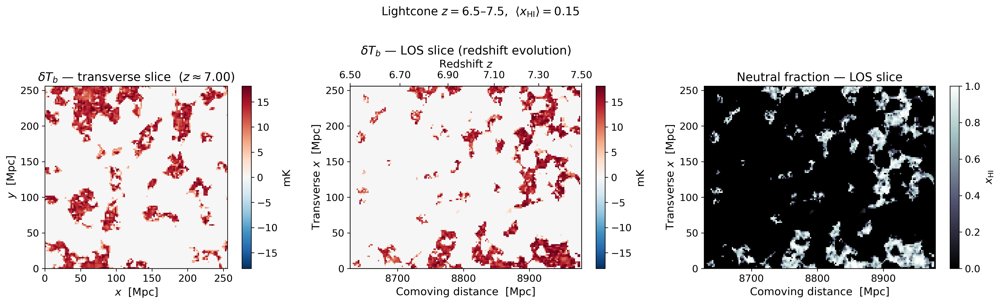

In [21]:
mid_z = N_z // 2
mid_y = HII_DIM // 2

# Extents for imshow
# Standard convention: LOS (comoving distance) on x-axis, transverse on y-axis
extent_xy  = [0, BOX_LEN, 0, BOX_LEN]                         # transverse slice [Mpc]
extent_los = [lc_dist_Mpc[0], lc_dist_Mpc[-1], 0, BOX_LEN]   # LOS on x, transverse on y [Mpc]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ── Panel 1: transverse slice at mid-LOS ───────────────────────────────────
# brightness_temp_field[:, :, mid_z] has shape (HII_DIM, HII_DIM) = (x, y)
# .T → (y, x); imshow(origin="lower"): rows=y (↑), cols=x (→)  ✓
vmax_T = np.percentile(np.abs(brightness_temp_field), 99)
im0 = axes[0].imshow(
    brightness_temp_field[:, :, mid_z].T,
    origin="lower", extent=extent_xy,
    cmap="RdBu_r", vmin=-vmax_T, vmax=vmax_T,
)
fig.colorbar(im0, ax=axes[0], label="mK")
axes[0].set_title(
    rf"$\delta T_b$ — transverse slice  ($z \approx {lc_redshifts[mid_z]:.2f}$)"
)
axes[0].set_xlabel("$x$  [Mpc]")
axes[0].set_ylabel("$y$  [Mpc]")

# ── Panel 2: LOS slice — 21 cm evolution ───────────────────────────────────
# brightness_temp_field[:, mid_y, :] has shape (HII_DIM, N_z) = (x_transverse, z_los)
# WITHOUT .T: imshow(origin="lower") → rows=x (y-axis=transverse), cols=z (x-axis=LOS)
# This gives the standard orientation: LOS on x, transverse on y
im1 = axes[1].imshow(
    brightness_temp_field[:, mid_y, :],        # shape (HII_DIM, N_z), no transpose
    origin="lower", extent=extent_los, aspect="auto",
    cmap="RdBu_r", vmin=-vmax_T, vmax=vmax_T,
)
fig.colorbar(im1, ax=axes[1], label="mK")
axes[1].set_title(r"$\delta T_b$ — LOS slice (redshift evolution)")
axes[1].set_xlabel("Comoving distance  [Mpc]")
axes[1].set_ylabel("Transverse $x$  [Mpc]")

# Secondary x-axis on top: redshift labels (twiny, NOT twinx)
ax_twin = axes[1].twiny()
ax_twin.set_xlim(axes[1].get_xlim())
z_ticks = np.linspace(z_min, z_max, 6)
d_ticks = np.interp(z_ticks, lc_redshifts, lc_dist_Mpc)
ax_twin.set_xticks(d_ticks)
ax_twin.set_xticklabels([f"{z:.2f}" for z in z_ticks])
ax_twin.set_xlabel("Redshift $z$")

# ── Panel 3: neutral fraction along same LOS slice ─────────────────────────
# Same orientation fix: shape (HII_DIM, N_z), no transpose
im2 = axes[2].imshow(
    neutral_fraction[:, mid_y, :],             # shape (HII_DIM, N_z), no transpose
    origin="lower", extent=extent_los, aspect="auto",
    cmap="bone", vmin=0, vmax=1,
)
fig.colorbar(im2, ax=axes[2], label=r"$x_{\rm HI}$")
axes[2].set_title("Neutral fraction — LOS slice")
axes[2].set_xlabel("Comoving distance  [Mpc]")
axes[2].set_ylabel("Transverse $x$  [Mpc]")

mean_xHI = np.mean(neutral_fraction)
plt.suptitle(
    rf"Lightcone $z = {z_min}$–${z_max}$,  "
    rf"$\langle x_{{\rm HI}} \rangle = {mean_xHI:.2f}$",
    fontsize=14, y=1.02,
)
plt.tight_layout()
plt.show()

## 5b  Brightness temperature evolution — lightcone slice

Wide-format slice through the lightcone volume, styled after the canonical
21cm reionisation visualisation (cf. Mesinger & Furlanetto 2007).
The x-axis runs along the line of sight from the observer (left, $z_{\rm min}$)
toward the high-redshift universe (right, $z_{\rm max}$); the y-axis is one
transverse spatial direction. A custom EoR colourmap maps dark tones to
fully-ionised regions ($\delta T_b \approx 0$) and warm tones to neutral gas.

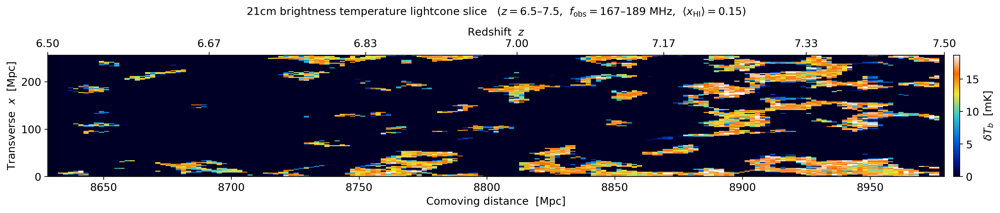

In [22]:
from matplotlib.colors import LinearSegmentedColormap

# ── EoR-inspired colormap ─────────────────────────────────────────────────
# dark blue-black (ionised, Tb≈0) → blue → cyan → yellow → orange → near-white
# Mirrors the custom colourmap used in 21cmFAST visualisations
_eor_nodes = [
    (0.00, (0.00, 0.00, 0.15)),
    (0.12, (0.00, 0.10, 0.55)),
    (0.30, (0.00, 0.40, 0.85)),
    (0.50, (0.20, 0.78, 0.82)),
    (0.68, (0.95, 0.90, 0.22)),
    (0.85, (0.95, 0.42, 0.00)),
    (1.00, (0.97, 0.97, 0.97)),
]
eor_cmap = LinearSegmentedColormap.from_list(
    "EoR21", [(v, c) for v, c in _eor_nodes], N=256
)

# ── Lightcone slice ───────────────────────────────────────────────────────
# brightness_temp_field has shape (HII_DIM, HII_DIM, N_z).
# Taking [:, mid_y, :] → (HII_DIM, N_z) = (x_transverse, z_los).
# imshow(origin="lower") maps rows→y-axis, cols→x-axis,
# so transverse is on y and LOS is on x.  This is the standard orientation.
T_slice = brightness_temp_field[:, mid_y, :]   # (HII_DIM, N_z)

# Colour limits: clip at zero (emission-only regime at z~6–8)
T_lo = max(0.0, np.percentile(T_slice, 1))
T_hi = np.percentile(T_slice, 99.5)

fig_lc, ax_lc = plt.subplots(figsize=(16, 3.5))

im_lc = ax_lc.imshow(
    T_slice,
    origin="lower",
    extent=[lc_dist_Mpc[0], lc_dist_Mpc[-1], 0, BOX_LEN],
    aspect="auto",
    cmap=eor_cmap,
    vmin=T_lo,
    vmax=T_hi,
)
cbar = fig_lc.colorbar(im_lc, ax=ax_lc, fraction=0.015, pad=0.01)
cbar.set_label(r"$\delta T_b$  [mK]", fontsize=12)

# ── Bottom axis: comoving distance ────────────────────────────────────────
ax_lc.set_xlabel("Comoving distance  [Mpc]", fontsize=12)
ax_lc.set_ylabel("Transverse  $x$  [Mpc]", fontsize=12)

# ── Top axis: redshift ────────────────────────────────────────────────────
ax_top = ax_lc.twiny()
ax_top.set_xlim(ax_lc.get_xlim())
z_ticks = np.linspace(z_min, z_max, 7)
d_ticks = np.interp(z_ticks, lc_redshifts, lc_dist_Mpc)
ax_top.set_xticks(d_ticks)
ax_top.set_xticklabels([f"{z:.2f}" for z in z_ticks])
ax_top.set_xlabel("Redshift  $z$", fontsize=12)

# Observed frequency at each redshift tick (for reference)
f_ticks_MHz = F_21_MHZ / (1 + z_ticks)
tick_labels_freq = [
    rf"$z={z:.2f}$" + "\n" + rf"$({f:.0f}$ MHz$)$"
    for z, f in zip(z_ticks, f_ticks_MHz)
]

f_lo = F_21_MHZ / (1 + z_max)
f_hi = F_21_MHZ / (1 + z_min)
mean_xHI_val = np.mean(neutral_fraction)
ax_lc.set_title(
    rf"21cm brightness temperature lightcone slice   "
    rf"($z = {z_min}$–${z_max}$,  "
    rf"$f_{{\rm obs}} = {f_lo:.0f}$–${f_hi:.0f}$ MHz,  "
    rf"$\langle x_{{\rm HI}} \rangle = {mean_xHI_val:.2f}$)",
    fontsize=12, pad=14,
)
plt.tight_layout()
plt.show()

### 5c  The post-cut galaxy overdensity on top of the 21 cm field

$\delta_{\rm gal}$ from §3c.2 — the Euclid-selected catalogue only — drawn on
the same transverse plane as the 21 cm field above. This is the real-space
view of the anti-correlation the cross-power spectrum in §6 measures:
galaxies are the sources that ionised the gas, so they sit where $\delta T_b$
has already been driven to zero.

Both maps are the mean over the **same** window of line-of-sight cells, so the
two fields are paired exactly as `compute_all_power_spectra()` pairs them in
§6. The overlays are transverse only, for the geometry reason set out in §3c.

The batch equivalent is `plot_galaxy_overdensity_on_21cm` in `src/figures.py`.


In [ ]:
# ==========================================================================
# 3c.3  The post-cut galaxy overdensity on top of the 21 cm field
#
# Both maps are the mean over the SAME window of LOS cells, so the two
# fields are paired exactly as compute_all_power_spectra() pairs them in §6:
# the sign of r below is the real-space counterpart of the large-scale
# cross-power.  Averaging over a slab rather than a single cell is what makes
# the sparse selected sample legible at all.
#
# Transverse only, by construction — see the geometry caveat above.
# ==========================================================================

from scipy.ndimage import gaussian_filter

SLAB_CELLS = 8        # LOS cells averaged into each map
SMOOTH_CELLS = 2.0    # Gaussian width for the contoured field — DISPLAY ONLY

_n_los = min(delta_gal_selected.shape[2], brightness_temp_field.shape[2])
_mid_z = _n_los // 2
_lo = max(_mid_z - SLAB_CELLS // 2, 0)
_hi = min(_lo + SLAB_CELLS, _n_los)

delta_map = delta_gal_selected[:, :, _lo:_hi].mean(axis=2)
temp_map = brightness_temp_field[:, :, _lo:_hi].mean(axis=2)

delta_smooth = gaussian_filter(delta_map, SMOOTH_CELLS)
temp_smooth = gaussian_filter(temp_map, SMOOTH_CELLS)

_grid_x = np.linspace(0, BOX_LEN, delta_map.shape[0])
_grid_y = np.linspace(0, BOX_LEN, delta_map.shape[1])
_extent_xy = [0, BOX_LEN, 0, BOX_LEN]


def contour_levels(field, quantiles=(0.80, 0.90, 0.97)):
    """Strictly increasing contour levels at quantiles of a 2D field."""
    finite = field[np.isfinite(field)]
    if finite.size == 0 or np.ptp(finite) <= 0:
        return np.array([])
    return np.unique(np.quantile(finite, quantiles))


fig, axes = plt.subplots(1, 3, figsize=(19, 5.5))

# ── Panel 1: delta_gal contours over the 21 cm field ─────────────────────
im0 = axes[0].imshow(
    temp_map.T, origin="lower", extent=_extent_xy, cmap=eor_cmap,
    vmin=0.0, vmax=float(np.percentile(temp_map, 99.5)), interpolation="nearest",
)
fig.colorbar(im0, ax=axes[0], label=r"$\delta T_b$  [mK]")

_gal_levels = contour_levels(delta_smooth)
if _gal_levels.size:
    _c = axes[0].contour(_grid_x, _grid_y, delta_smooth.T, levels=_gal_levels,
                         colors="crimson", linewidths=1.0, alpha=0.9)
    axes[0].clabel(_c, fmt=lambda v: f"{v:.2f}", fontsize=7)
axes[0].set_title(r"$\delta_{\rm gal}$ contours over $\delta T_b$")

# ── Panel 2: the same maps, roles swapped ────────────────────────────────
im1 = axes[1].imshow(
    delta_map.T, origin="lower", extent=_extent_xy,
    cmap="RdBu_r", norm=overdensity_norm(delta_map), interpolation="nearest",
)
fig.colorbar(im1, ax=axes[1], label=r"$\delta_{\rm gal}$")

_temp_levels = contour_levels(temp_smooth)
if _temp_levels.size:
    _c = axes[1].contour(_grid_x, _grid_y, temp_smooth.T, levels=_temp_levels,
                         colors="k", linewidths=1.0, alpha=0.8)
    axes[1].clabel(_c, fmt=lambda v: f"{v:.0f}", fontsize=7)
axes[1].set_title(r"$\delta T_b$ contours over $\delta_{\rm gal}$")

for ax in axes[:2]:
    ax.set_xlabel("$x$  [Mpc]")
    ax.set_ylabel("$y$  [Mpc]")
    ax.set_aspect("equal")

# ── Panel 3: the cell-by-cell relation over every cell ───────────────────
# A 2D histogram is unreadable here: delta_gal is a sparse count field, so it
# is quantised and most cells sit at -1.  Binning delta_gal by delta T_b
# instead averages that shot noise away and leaves the trend the cross-power
# measures — galaxies avoid the neutral, 21 cm-bright gas.
_gal_flat = delta_gal_selected[:, :, :_n_los].ravel()
_temp_flat = brightness_temp_field[:, :, :_n_los].ravel().astype(float)

_edges = np.unique(np.quantile(_temp_flat, np.linspace(0.0, 1.0, 26)))
_index = np.clip(np.digitize(_temp_flat, _edges[1:-1]), 0, _edges.size - 2)
_counts = np.bincount(_index, minlength=_edges.size - 1).astype(float)
_occupied = _counts > 0

_sum_x = np.bincount(_index, weights=_temp_flat, minlength=_edges.size - 1)
_sum_y = np.bincount(_index, weights=_gal_flat, minlength=_edges.size - 1)
_sum_yy = np.bincount(_index, weights=_gal_flat ** 2, minlength=_edges.size - 1)

_counts = _counts[_occupied]
_centres = _sum_x[_occupied] / _counts
_means = _sum_y[_occupied] / _counts
_errors = np.sqrt(
    np.maximum(_sum_yy[_occupied] / _counts - _means ** 2, 0.0) / _counts
)

pearson_r = float(np.corrcoef(_temp_flat, _gal_flat)[0, 1])
axes[2].errorbar(_centres, _means, yerr=_errors, fmt="o-", ms=4, lw=1.2,
                 color="crimson", ecolor="0.5", capsize=2)
axes[2].axhline(0.0, color="k", ls="--", lw=1.0)
axes[2].set_xlabel(r"$\delta T_b$  [mK]")
axes[2].set_ylabel(r"$\langle \delta_{\rm gal} \rangle$")
axes[2].set_title(
    rf"Mean $\delta_{{\rm gal}}$ per $\delta T_b$ bin  ($r = {pearson_r:+.3f}$)"
)

fig.suptitle(
    rf"Euclid-selected galaxies against the 21 cm field at "
    rf"$z_{{\rm obs}} = {z_obs}$  "
    rf"(${M_UV_bright} \leq M_{{\rm UV}} \leq {M_UV_faint}$, "
    rf"{_selection_check.n_selected:,} galaxies; maps are the mean over "
    rf"{_hi - _lo} LOS cells at cell {_mid_z})",
    fontsize=13,
)
plt.tight_layout()
plt.show()

print(f"Pearson r (delta_T_b, delta_gal) over {_gal_flat.size:,} cells "
      f"= {pearson_r:+.4f}")


## 6  Compute the 2D cylindrical power spectra

The lightcone box is non-cubic: $(HII\_DIM, HII\_DIM, N_z)$ with transverse size
$L_\perp = BOX\_LEN$ and LOS size $L_{\rm LOS}$. The estimator handles this by
using separate cell sizes and fundamental modes for the transverse and LOS
directions:

$$
P(\mathbf{k}) = \frac{\big[\tilde{A}(\mathbf{k})\,\tilde{B}^*(\mathbf{k})\big]_{\rm Re}}{V},
\qquad \tilde{A} = \mathrm{FFT}(A)\cdot \Delta x^2 \Delta z,
\qquad V = L_\perp^2 L_{\rm LOS}
$$

binned into 20 × 20 **log-spaced** $(k_\perp, k_\parallel)$ cells with geometric
bin centres; empty bins are `NaN`.

We import it from `src/analysis.py` — `compute_all_power_spectra`, which wraps
`compute_cylindrical_cross_power` — rather than redefining it here, so the
notebook and `run_pipeline.py` share one estimator. It returns:

- $P_{21}(k_\perp, k_\parallel)$ — 21 cm auto-power (mean-subtracted internally)
- $P_{\rm gal}(k_\perp, k_\parallel)$ — galaxy auto-power
- $P_{21 \times \rm gal}(k_\perp, k_\parallel)$ — cross-power (expected to be **negative** on large scales)
- `mode_counts` — the number of Fourier modes averaged into each bin

> **`mode_counts` is not divided into the variance below.** La Plante's
> Eqs. 15–17 are written per *single* mode; averaging $N_k$ of them would
> divide the variance by $N_k$. Neither this notebook nor the pipeline applies
> that factor, so the quoted total SNR is a per-bin quadrature sum and is
> **conservative**. See `docs/uncertainty_budget.md` §7.3.

In [23]:
# ======================================================================
#  Compute all three 2D cylindrical power spectra
#
#  The estimator lives in src/analysis.py — compute_cylindrical_cross_power,
#  wrapped by compute_all_power_spectra, which handles the non-cubic
#  (HII_DIM, HII_DIM, N_z) lightcone box by using separate cell sizes and
#  fundamental modes for the transverse and LOS directions.  It subtracts the
#  global mean from the brightness temperature; the galaxy field is already an
#  overdensity.  This is the exact function run_pipeline.py calls.
# ======================================================================
print("Computing 2D cylindrical power spectra …")

spectra = compute_all_power_spectra(
    brightness_temp_field=brightness_temp_field,
    galaxy_overdensity=galaxy_overdensity,
    box_len_perp=BOX_LEN,
    box_len_los=L_los,
    n_bins_perp=n_bins_perp,
    n_bins_parallel=n_bins_parallel,
)

# Unpack into the names the plotting cells below use
k_perp        = spectra.k_perp
k_parallel    = spectra.k_parallel
P_21cm_auto   = spectra.P_21cm_auto
P_galaxy_auto = spectra.P_galaxy_auto
P_cross       = spectra.P_cross
mode_counts   = spectra.mode_counts

large_scale_mean = np.nanmean(P_cross[:5, :5])
n_empty = np.sum(mode_counts == 0)
print(f"k_perp     range : [{k_perp.min():.4f},  {k_perp.max():.3f}] Mpc⁻¹")
print(f"k_parallel range : [{k_parallel.min():.4f},  {k_parallel.max():.3f}] Mpc⁻¹")
print(f"Empty bins       : {n_empty} / {mode_counts.size}")
print(
    f"Large-scale cross-spectrum sign: "
    f"{'NEGATIVE (anti-correlated) ✓' if large_scale_mean < 0 else 'POSITIVE'}"
)

Computing 2D cylindrical power spectra …
k_perp     range : [0.0140,  2.046] Mpc⁻¹
k_parallel range : [0.0102,  1.440] Mpc⁻¹
Empty bins       : 128 / 400
Large-scale cross-spectrum sign: NEGATIVE (anti-correlated) ✓


## 7  Plot the 2D cylindrical power spectra

Three panels showing $P_{21}$, $P_{\rm gal}$, and the signed cross-power
$P_{21\times\rm gal}$ in $(k_\perp,\, k_\parallel)$ space, with the
foreground horizon and HERA primary-beam wedge overlaid.

Reference z_obs        : 7.0
H(z_obs)               : 857.26 km/s/Mpc
Observed wavelength    : λ = 1.690 m
Comoving distance      : D_c = 8821 Mpc
Horizon wedge slope    : m = 3.1509
HERA beam half-angle   : θ = 6.9°
HERA FoV wedge slope   : m_FoV = 0.3794


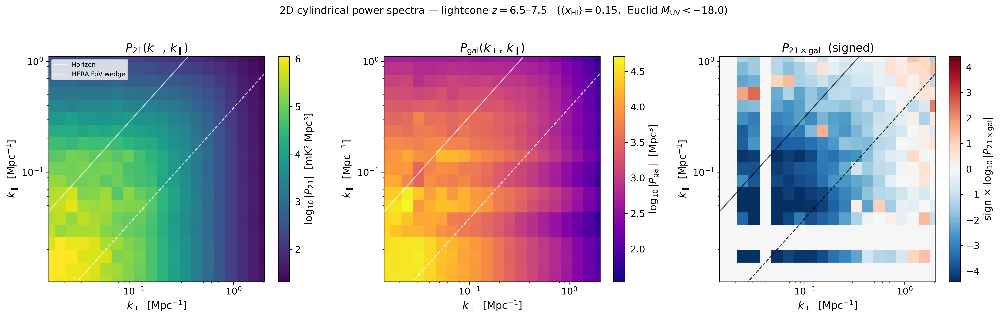

In [24]:
def fill_nan_nearest(arr):
    """Replace NaN pixels with the nearest non-NaN neighbour (display only)."""
    mask = np.isnan(arr)
    if not mask.any():
        return arr
    filled = arr.copy()
    for _ in range(max(arr.shape)):
        if not np.isnan(filled).any():
            break
        kernel_filled = generic_filter(filled, np.nanmean, size=3, mode="nearest")
        filled = np.where(np.isnan(filled), kernel_filled, filled)
    return filled


# ======================================================================
#  Foreground wedge geometry  (Thyagarajan+2015; La Plante+2023, Eq. 10)
#  Evaluated at the reference redshift z_obs.
#
#  Both slopes come from src.analysis — the same functions run_pipeline.py
#  uses.  horizon_wedge_slope() implements
#
#      m(z) = D_C(z) H(z) / [c (1 + z)]
#
#  which is algebraically identical to the longhand form through the observed
#  wavelength, lambda_obs * D_C * nu_21 * H / (c_mps * c_kms * (1+z)^2),
#  since lambda_obs * nu_21 = c_mps * (1 + z).
# ======================================================================
Hz_obs               = hubble_parameter(z_obs, HUBBLE_CONSTANT, OMEGA_M_0)
comoving_distance_obs = comoving_distance(z_obs, **COSMOLOGY)

lambda_obs = SPEED_OF_LIGHT_MPS * (1 + z_obs) / F_21_HZ   # observed wavelength  [m]
theta_fov  = lambda_obs / HERA_DISH_DIAMETER              # beam half-angle  [rad]

horizon_slope   = horizon_wedge_slope(z_obs, **COSMOLOGY)
fov_wedge_slope_value = fov_wedge_slope(
    z_obs,
    dish_diameter=HERA_DISH_DIAMETER,
    f_21_hz=F_21_HZ,
    speed_of_light_mps=SPEED_OF_LIGHT_MPS,
    **COSMOLOGY,
)

k_perp_line   = np.logspace(np.log10(k_perp.min()), np.log10(k_perp.max()), 200)
k_par_horizon = k_perp_line * horizon_slope
k_par_fov     = k_perp_line * fov_wedge_slope_value

print(f"Reference z_obs        : {z_obs}")
print(f"H(z_obs)               : {Hz_obs:.2f} km/s/Mpc")
print(f"Observed wavelength    : λ = {lambda_obs:.3f} m")
print(f"Comoving distance      : D_c = {comoving_distance_obs:.0f} Mpc")
print(f"Horizon wedge slope    : m = {horizon_slope:.4f}")
print(f"HERA beam half-angle   : θ = {np.degrees(theta_fov):.1f}°")
print(f"HERA FoV wedge slope   : m_FoV = {fov_wedge_slope_value:.4f}")

# ── Plot ──────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

# Panel 1: 21 cm auto-power
P21_display = fill_nan_nearest(np.log10(np.abs(P_21cm_auto.T)))
im0 = axes[0].pcolormesh(
    k_perp, k_parallel, P21_display, cmap="viridis", shading="auto"
)
fig.colorbar(im0, ax=axes[0], label=r"$\log_{10} |P_{21}|$  [mK² Mpc³]")
axes[0].plot(k_perp_line, k_par_horizon, "w-",  lw=1.2, alpha=0.7, label="Horizon")
axes[0].plot(k_perp_line, k_par_fov,     "w--", lw=1.2, alpha=0.8, label="HERA FoV wedge")
axes[0].legend(loc="upper left", fontsize=8)
axes[0].set_title(r"$P_{21}(k_\perp,\, k_\parallel)$")

# Panel 2: galaxy auto-power
Pgal_display = fill_nan_nearest(np.log10(np.abs(P_galaxy_auto.T)))
im1 = axes[1].pcolormesh(
    k_perp, k_parallel, Pgal_display, cmap="plasma", shading="auto"
)
fig.colorbar(im1, ax=axes[1], label=r"$\log_{10} |P_{\rm gal}|$  [Mpc³]")
axes[1].plot(k_perp_line, k_par_horizon, "w-",  lw=1.2, alpha=0.7)
axes[1].plot(k_perp_line, k_par_fov,     "w--", lw=1.2, alpha=0.8)
axes[1].set_title(r"$P_{\rm gal}(k_\perp,\, k_\parallel)$")

# Panel 3: signed cross-power
cross_amp      = np.abs(P_cross.T)
cross_sgn      = np.sign(P_cross.T)
signed_log_raw = np.where(cross_amp > 0, np.log10(cross_amp) * cross_sgn, 0.0)
signed_log     = fill_nan_nearest(signed_log_raw)
clim           = np.nanpercentile(np.abs(signed_log[signed_log != 0]), 95)

im2 = axes[2].pcolormesh(
    k_perp, k_parallel, signed_log,
    cmap="RdBu_r", shading="auto", vmin=-clim, vmax=clim,
)
fig.colorbar(im2, ax=axes[2],
             label=r"sign $\times$ $\log_{10} |P_{21 \times \rm gal}|$")
axes[2].plot(k_perp_line, k_par_horizon, "k-",  lw=1.2, alpha=0.7)
axes[2].plot(k_perp_line, k_par_fov,     "k--", lw=1.2, alpha=0.8)
axes[2].set_title(r"$P_{21 \times \rm gal}$  (signed)")

mean_xHI = np.mean(neutral_fraction)
for ax in axes:
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$k_\perp$  [Mpc$^{-1}$]")
    ax.set_ylabel(r"$k_\parallel$  [Mpc$^{-1}$]")
    ax.set_xlim(k_perp[0], k_perp[-1])
    ax.set_ylim(k_parallel[0], k_parallel[-2])

plt.suptitle(
    rf"2D cylindrical power spectra — lightcone $z = {z_min}$–${z_max}$   "
    rf"($\langle x_{{\rm HI}} \rangle = {mean_xHI:.2f}$,  "
    rf"Euclid $M_{{\rm UV}} < {M_UV_faint}$)",
    fontsize=13, y=1.02,
)
plt.tight_layout()
plt.show()

## 7b  Photo-$z$ suppression of the line-of-sight modes

Before the full uncertainty budget, a look at the single largest cost of using a
*photometric* galaxy survey. A photo-$z$ error $\sigma_z$ smears galaxy positions
along the line of sight by a comoving length

$$\sigma_r = \frac{c\,\sigma_z}{H(z_{\rm obs})}\quad[\mathrm{Mpc}],$$

which multiplies the cross-power by the Gaussian kernel

$$W(k_\parallel) = \exp\!\left(-\tfrac{1}{2}\,k_\parallel^2\,\sigma_r^2\right).$$

The curves below sweep $\sigma_z$ from spectroscopic ($\sigma_z = 0$, $W \equiv 1$)
to the adopted Euclid Wide value. Damping becomes severe above
$k_\parallel \gtrsim 1/\sigma_r$ — for $\sigma_z = 0.45$ that threshold sits at the
very bottom of the accessible $k_\parallel$ range, which is why so little
line-of-sight information survives.

σ_z = 0     σ_r =     0.0 Mpc   W at lowest sampled k_∥ = 0.0102 Mpc⁻¹ : 1
σ_z = 0.02  σ_r =     7.0 Mpc   W at lowest sampled k_∥ = 0.0102 Mpc⁻¹ : 0.997
σ_z = 0.05  σ_r =    17.5 Mpc   W at lowest sampled k_∥ = 0.0102 Mpc⁻¹ : 0.984
σ_z = 0.1   σ_r =    35.0 Mpc   W at lowest sampled k_∥ = 0.0102 Mpc⁻¹ : 0.938
σ_z = 0.3   σ_r =   105.0 Mpc   W at lowest sampled k_∥ = 0.0102 Mpc⁻¹ : 0.562
σ_z = 0.45  σ_r =   157.5 Mpc   W at lowest sampled k_∥ = 0.0102 Mpc⁻¹ : 0.274

1/σ_r (σ_z = 0.45) = 0.0064 Mpc⁻¹   vs. lowest sampled k_∥ = 0.0102 Mpc⁻¹


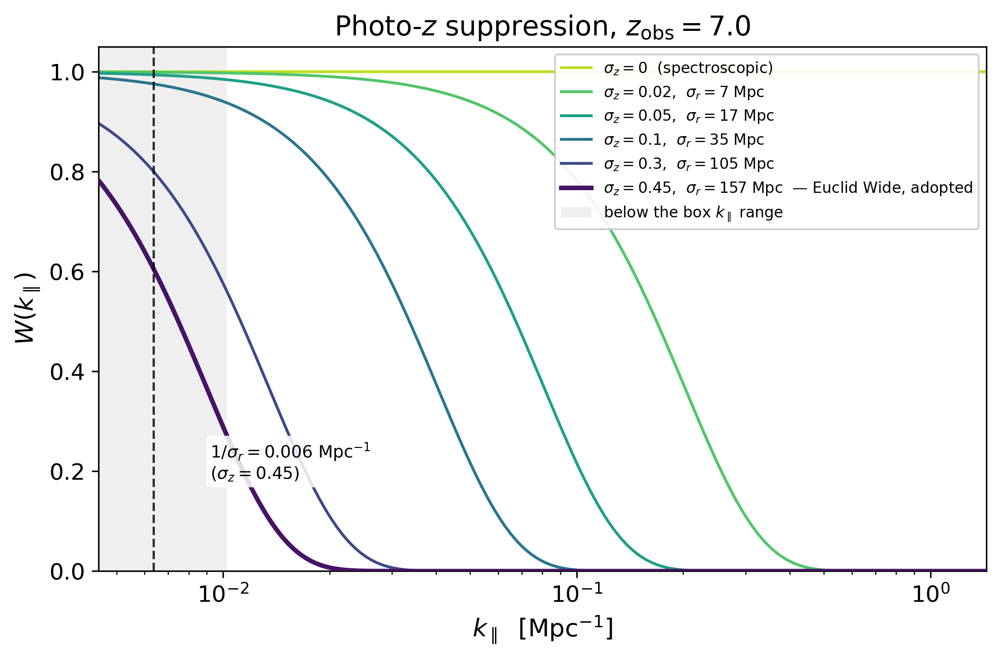

In [25]:
# ======================================================================
#  Photo-z suppression of the line-of-sight modes
#
#  Both the smearing length and the kernel come from src.analysis — the same
#  two functions compute_uncertainty_budget() applies in step ① of the budget
#  below, so this figure cannot drift from the damping actually adopted:
#
#      sigma_r = c sigma_z / H(z_obs)            radial_smearing_length
#      W(k_par) = exp(-k_par^2 sigma_r^2 / 2)    photoz_damping_kernel
#
#  sigma_z = 0 is the spectroscopic limit: sigma_r = 0, so W = 1 everywhere.
# ======================================================================
from src.analysis import photoz_damping_kernel, radial_smearing_length

sigma_z_scenarios = [0.0, 0.02, 0.05, 0.10, 0.30, photoz_uncertainty]
colors            = plt.cm.viridis_r(np.linspace(0.10, 0.95, len(sigma_z_scenarios)))

# Same k_parallel span as the 2D spectra above, finely sampled for the curves.
# Extended down to 1/sigma_r of the adopted scenario when that lies below the
# lowest sampled bin, so the damping-scale marker below stays on the axis.
k_par_lo   = min(k_parallel[0], 1.0 / radial_smearing_length(
    photoz_uncertainty=photoz_uncertainty, z_obs=z_obs, **COSMOLOGY)) * 0.7
k_par_line = np.logspace(np.log10(k_par_lo), np.log10(k_parallel[-1]), 400)

fig, ax = plt.subplots(figsize=(7.5, 5))

for sigma_z, color in zip(sigma_z_scenarios, colors):
    sigma_r = radial_smearing_length(
        photoz_uncertainty=sigma_z, z_obs=z_obs, **COSMOLOGY
    )
    kernel = photoz_damping_kernel(k_par_line, sigma_r).ravel()

    is_adopted = np.isclose(sigma_z, photoz_uncertainty)
    label = rf"$\sigma_z = {sigma_z:g}$"
    if sigma_z == 0.0:
        label += "  (spectroscopic)"
    else:
        label += rf",  $\sigma_r = {sigma_r:.0f}$ Mpc"
    if is_adopted:
        label += "  — Euclid Wide, adopted"

    ax.plot(
        k_par_line, kernel,
        color=color, lw=2.4 if is_adopted else 1.5,
        zorder=3 if is_adopted else 2, label=label,
    )

    W_first_bin = photoz_damping_kernel(k_parallel[:1], sigma_r).ravel()[0]
    print(f"σ_z = {sigma_z:<5g} σ_r = {sigma_r:7.1f} Mpc   "
          f"W at lowest sampled k_∥ = {k_parallel[0]:.3g} Mpc⁻¹ : {W_first_bin:.3g}")

# ── Damping scale of the adopted scenario ─────────────────────────────────
#  1/sigma_r is where W has fallen to exp(-1/2) ~ 0.61.  For sigma_z = 0.45 it
#  lands *below* the lowest k_par the box samples, so the axis is extended to
#  the left to keep the marker on-canvas; the shaded strip flags the modes the
#  (HII_DIM, HII_DIM, N_z) volume does not measure.
sigma_r_adopted = radial_smearing_length(
    photoz_uncertainty=photoz_uncertainty, z_obs=z_obs, **COSMOLOGY
)
k_damp = 1.0 / sigma_r_adopted
print(f"\n1/σ_r (σ_z = {photoz_uncertainty:g}) = {k_damp:.4f} Mpc⁻¹   "
      f"vs. lowest sampled k_∥ = {k_parallel[0]:.4f} Mpc⁻¹")

x_lo = min(k_parallel[0], k_damp * 0.7)
if k_damp < k_parallel[0]:
    ax.axvspan(x_lo, k_parallel[0], color="0.5", alpha=0.12, lw=0, zorder=0,
               label=r"below the box $k_\parallel$ range")

ax.axvline(k_damp, color="k", ls="--", lw=1.2, alpha=0.8, zorder=4)
ax.text(
    k_damp * 1.45, 0.26,
    rf"$1/\sigma_r = {k_damp:.3f}$ Mpc$^{{-1}}$" "\n"
    rf"($\sigma_z = {photoz_uncertainty:g}$)",
    fontsize=9, va="top", ha="left", zorder=5,
    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="none", alpha=0.85),
)

ax.set_xscale("log")
ax.set_xlim(x_lo, k_parallel[-1])
ax.set_ylim(0, 1.05)
ax.set_xlabel(r"$k_\parallel$  [Mpc$^{-1}$]")
ax.set_ylabel(r"$W(k_\parallel)$")
ax.set_title(rf"Photo-$z$ suppression, $z_{{\rm obs}} = {z_obs}$")
ax.legend(loc="upper right", fontsize=8, framealpha=0.9)

plt.tight_layout()
plt.show()


## 7c  The galaxy power spectrum against the foreground wedge

The same $P_{\rm gal}(k_\perp, k_\parallel)$ as the middle panel of §7, replotted
on its own with the wedge region filled in rather than only outlined. Modes below
the horizon line are irrecoverably contaminated by smooth-spectrum foregrounds
leaking to high $k_\parallel$ through the chromatic instrument response
(Datta+2010; Thyagarajan+2015); step ② of the uncertainty budget discards them.
The HERA primary-beam (FoV) wedge, the shallower of the two lines, is where the
bulk of the leakage actually sits.

Read together with §7b, this is the geometry of the problem: photo-$z$ damping
removes the high-$k_\parallel$ modes, the wedge removes the low-$k_\parallel$ ones
at fixed $k_\perp$, and the cross-correlation survives on what is left between.

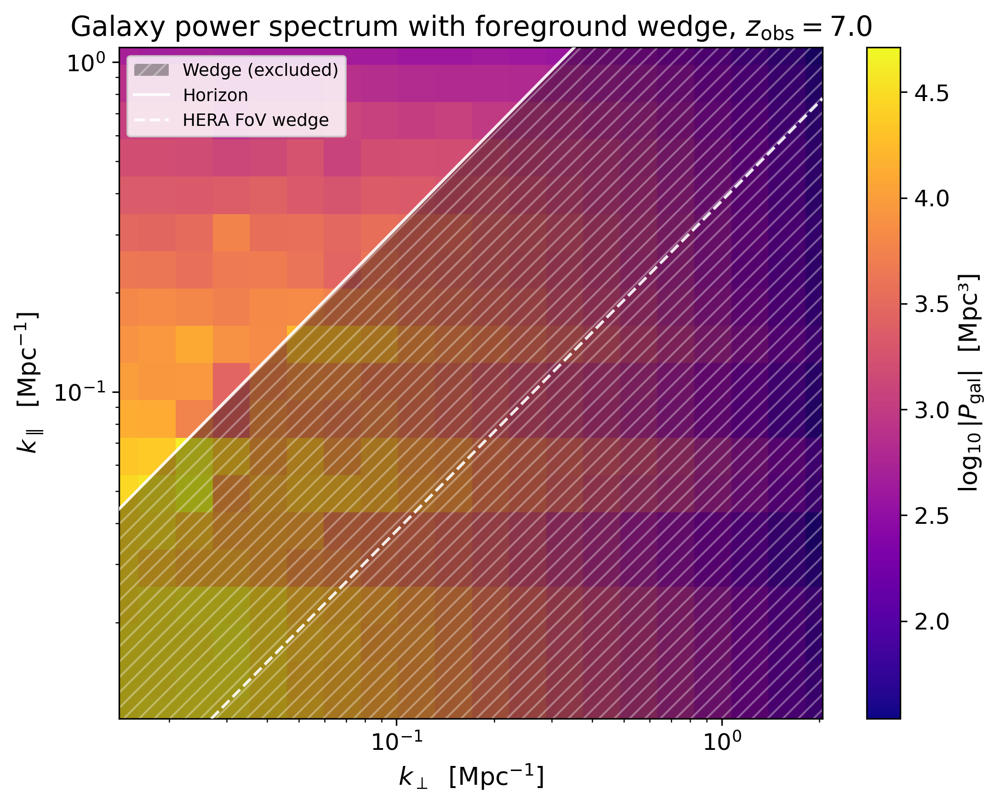

In [26]:
# ======================================================================
#  Galaxy auto-power with the foreground wedge filled in.
#
#  Everything here is already defined above: fill_nan_nearest, k_perp,
#  k_parallel and P_galaxy_auto, plus the wedge geometry computed in the §7
#  plotting cell (horizon_slope, fov_wedge_slope_value, and the k_perp_line /
#  k_par_horizon / k_par_fov lines built from them).  Nothing is recomputed.
# ======================================================================
fig, ax = plt.subplots(figsize=(7.5, 6))

Pgal_display = fill_nan_nearest(np.log10(np.abs(P_galaxy_auto.T)))
im = ax.pcolormesh(
    k_perp, k_parallel, Pgal_display, cmap="plasma", shading="auto", zorder=1
)
fig.colorbar(im, ax=ax, label=r"$\log_{10} |P_{\rm gal}|$  [Mpc³]")

# ── Wedge region: everything below the horizon line ───────────────────────
#  Filled between the bottom of the axis and k_par_horizon; matplotlib clips
#  the patch to the axis limits set below.
ax.fill_between(
    k_perp_line, k_parallel[0], k_par_horizon,
    where=k_par_horizon > k_parallel[0],
    facecolor="black", alpha=0.35, hatch="///", edgecolor="white", lw=0.0,
    zorder=2, label="Wedge (excluded)",
)

# ── Wedge boundaries ──────────────────────────────────────────────────────
ax.plot(k_perp_line, k_par_horizon, "w-",  lw=1.5, alpha=0.9,
        zorder=3, label="Horizon")
ax.plot(k_perp_line, k_par_fov,     "w--", lw=1.5, alpha=0.9,
        zorder=3, label="HERA FoV wedge")

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel(r"$k_\perp$  [Mpc$^{-1}$]")
ax.set_ylabel(r"$k_\parallel$  [Mpc$^{-1}$]")
ax.set_xlim(k_perp[0], k_perp[-1])
ax.set_ylim(k_parallel[0], k_parallel[-2])
ax.set_title(
    rf"Galaxy power spectrum with foreground wedge, $z_{{\rm obs}} = {z_obs}$"
)
ax.legend(loc="upper left", fontsize=9, framealpha=0.85)

plt.tight_layout()
plt.show()


## 7d  What the wedge does in *real* space

§7c drew the wedge as a boundary in $(k_\perp, k_\parallel)$. Excising it is not
an abstract bookkeeping step: those modes are thrown away, and the galaxy field
that survives is a physically different field. Here the same cut is applied
directly to the 3D overdensity —

$$\tilde\delta_{\rm gal}(\mathbf{k}) \;\rightarrow\; 0
\quad\text{wherever}\quad k_\parallel \le m_{\rm horizon}\,k_\perp,$$

then inverse-transformed back. The panels show the identical line-of-sight slice
before and after, on a shared colour scale.

The cut keeps only $k_\parallel > m\,k_\perp$ with $m \approx 3.15$ at
$z = 7$, so what survives is structure that varies *rapidly along the line of
sight* while being smooth transversally. The filtered panel shows exactly that:
the clumpy texture of the original collapses into stripes elongated across the
LOS axis, and the variance falls to a small fraction of what it was — on the
shared colour scale the field is visibly washed out. Almost everything a galaxy
survey would recognise as a structure lives inside the wedge. This is the
real-space cost of the cut that §8 applies as a mask.

Horizon slope m         : 3.1509  (buffer = 0)
Modes excluded          : 97.4% (2,791,674 of 2,867,200)
δ_gal std  before wedge : 5.7272
δ_gal std  after  wedge : 1.2954   (22.62% retained)


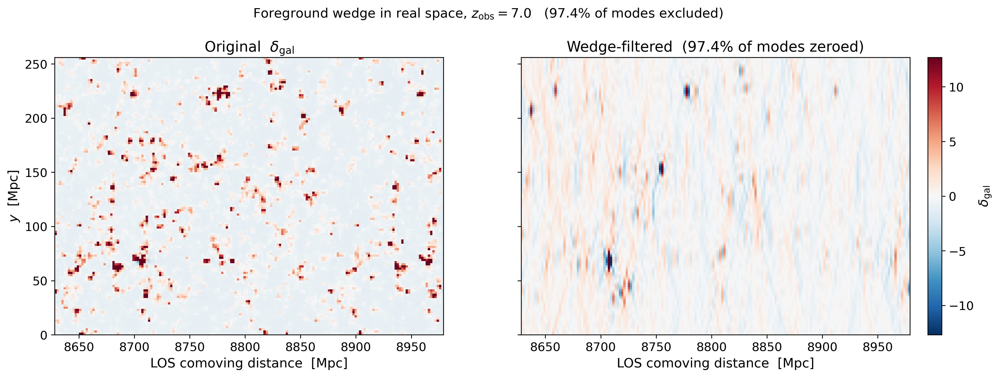

In [29]:
# ======================================================================
#  The foreground wedge applied to the galaxy field in real space.
#
#  Reuses what is already defined: `galaxy_overdensity` (post-Kaiser, the very
#  field §6 fed to compute_all_power_spectra), the 3D wavenumber grids KX/KY/KZ
#  built in §4, `horizon_slope` from §7, and §5's slice indices and extents.
#  The mask itself is src.analysis.foreground_wedge_mask — the same function
#  the budget uses — not a hand-rolled comparison.
# ======================================================================
from src.analysis import foreground_wedge_mask

# ── Wedge mask on the full 3D FFT grid ────────────────────────────────────
#  The condition factorises: k_perp varies over the transverse plane only,
#  k_par over the LOS axis only.  So the (N*N, N_z) mask that
#  foreground_wedge_mask returns for the flattened transverse plane reshapes
#  straight back onto the (N, N, N_z) grid.
#
#  buffer=0.0 gives exactly the boundary asked for, k_par <= slope * k_perp —
#  the bare horizon line of §7c.  §8's excision instead adds `wedge_buffer`,
#  so it discards slightly more than is discarded here.
k_perp_plane = np.hypot(KX[:, :, 0], KY[:, :, 0])          # (N, N)  [Mpc^-1]

outside_wedge_3d = foreground_wedge_mask(
    k_perp_plane.ravel(), np.abs(kz), horizon_slope, buffer=0.0
).reshape(N, N, N_z)

percent_excluded = 100.0 * (1.0 - outside_wedge_3d.sum() / outside_wedge_3d.size)

# ── Filter: FFT -> zero the wedge -> inverse FFT ──────────────────────────
delta_gal_k          = np.fft.fftn(galaxy_overdensity)
delta_gal_k_filtered = np.where(outside_wedge_3d, delta_gal_k, 0.0)
galaxy_overdensity_wedge_filtered = np.fft.ifftn(delta_gal_k_filtered).real

print(f"Horizon slope m         : {horizon_slope:.4f}  (buffer = 0)")
print(f"Modes excluded          : {percent_excluded:.1f}% "
      f"({outside_wedge_3d.size - outside_wedge_3d.sum():,} of {outside_wedge_3d.size:,})")
print(f"δ_gal std  before wedge : {galaxy_overdensity.std():.4f}")
print(f"δ_gal std  after  wedge : {galaxy_overdensity_wedge_filtered.std():.4f}"
      f"   ({galaxy_overdensity_wedge_filtered.std() / galaxy_overdensity.std():.2%} retained)")

# ── Plot: same LOS slice, before and after, shared colour scale ───────────
#  Same convention as §5's centre panel — field[:, mid_y, :] with no .T and
#  origin="lower" puts the LOS on x and the transverse axis on y.
fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

vmax_gal = np.percentile(np.abs(galaxy_overdensity), 99)

panels = [
    (galaxy_overdensity,                   r"Original  $\delta_{\rm gal}$"),
    (galaxy_overdensity_wedge_filtered,
     rf"Wedge-filtered  ({percent_excluded:.1f}% of modes zeroed)"),
]

for ax, (field, title) in zip(axes, panels):
    im = ax.imshow(
        field[:, mid_y, :],
        origin="lower", extent=extent_los, aspect="auto",
        cmap="RdBu_r", vmin=-vmax_gal, vmax=vmax_gal,
    )
    ax.set_title(title)
    ax.set_xlabel(r"LOS comoving distance  [Mpc]")

axes[0].set_ylabel(r"$y$  [Mpc]")
fig.colorbar(im, ax=axes, label=r"$\delta_{\rm gal}$", fraction=0.025, pad=0.02)

plt.suptitle(
    rf"Foreground wedge in real space, $z_{{\rm obs}} = {z_obs}$   "
    rf"({percent_excluded:.1f}% of modes excluded)",
    fontsize=13, y=1.02,
)
plt.show()


## 8  The uncertainty budget

Everything from here on is computed by a **single call** to
`compute_uncertainty_budget()` from `src/analysis.py` — the same function
`run_pipeline.py` calls on the HPC run. Nothing below is reimplemented in this
notebook. The full specification, including the term-by-term audit of this
calculation, lives in [`docs/uncertainty_budget.md`](docs/uncertainty_budget.md).

The budget applies four transformations in order:

$$
P_{21},\; P_{\rm gal},\; P_\times
\;\xrightarrow{\;①\;}\; \text{photo-}z\text{ damping}
\;\xrightarrow{\;②\;}\; \text{wedge excision}
\;\xrightarrow{\;③\;}\; \text{noise}
\;\xrightarrow{\;④\;}\; \sigma_\times,\ \mathrm{SNR}
$$

---

### ① Photo-$z$ radial smearing

A photometric redshift uncertainty $\sigma_z$ translates into a comoving
line-of-sight position uncertainty:

$$
\sigma_r = \frac{c\,\sigma_z}{H(z_{\rm obs})} \quad [\text{Mpc}]
$$

This is *not* the halo mass function's $\sigma$ — it is a length scale.

> **$\sigma_z$ is absolute, not $\sigma_z/(1+z)$.** Surveys quote the
> fractional form. Euclid's requirement $\sigma_z/(1+z) < 0.05$ means
> $\sigma_z \approx 0.45$ at $z = 7$, giving $\sigma_r = 157.5$ Mpc — not the
> 20.6 Mpc that the fractional value would imply. The configuration cell now
> uses 0.45.

**Damping kernel.** The smearing suppresses line-of-sight modes via a Gaussian
window:

$$
W(k_\parallel) = \exp\left(-\tfrac{1}{2}\,k_\parallel^2\,\sigma_r^2\right)
$$

- Equals 1 at $k_\parallel = 0$ (large transverse-only scales are unaffected).
- Falls off rapidly once $k_\parallel \gtrsim 1/\sigma_r$.
- **Only** $k_\parallel$ is affected — $k_\perp$ modes are untouched.

**Why cross and auto get different damping.** Only the galaxy field carries
photo-$z$ error (the 21 cm radial coordinate comes from frequency, essentially
exact). So:

$$
P_{\rm cross}^{\rm obs} = P_{\rm cross} \cdot W(k_\parallel), \qquad
P_{\rm gal}^{\rm obs} = P_{\rm gal} \cdot W(k_\parallel)^2
$$

The cross-spectrum picks up **one** factor of $W$; the galaxy auto-spectrum
picks up **two**. This is a real advantage of cross-correlation.

---

### ② Foreground wedge

Spectrally smooth foreground emission contaminates a region of
$(k_\perp, k_\parallel)$ space bounded by a straight line through the origin:

$$
k_\parallel \lesssim m(z)\,\sin\theta \; k_\perp + k_{\rm buffer}, \qquad
m(z) = \frac{D_C(z)\,H(z)}{c\,(1+z)}
$$

- $m(z)$ is the geometric conversion between angular and line-of-sight Fourier
  scales — **not** simply $\sin\theta$ itself.
- $\theta$ is the angle out to which foreground emission is picked up
  (horizon: $\sin\theta = 1$; primary beam: $\sin\theta = \theta_{\rm FoV}$).
- $k_{\rm buffer}$ is a margin beyond the theoretical line for calibration
  errors and spectral leakage. We use **0.0677 Mpc⁻¹** = 0.1 $h$ Mpc⁻¹ at
  $h = 0.6766$ (Pober et al. 2014 "moderate"; the 21cmSense default).

The **horizon** slope defines the mask — that is the configuration Pober et
al.'s buffer was calibrated against. The FoV slope is plotted only. Modes
*above* the line survive; everything below is masked out.

---

### ③ Noise

$$
T_{\rm sys} = 100\,\mathrm{K} + 60\,\mathrm{K}\left(\frac{300\,\mathrm{MHz}}{\nu_{\rm obs}}\right)^{2.55},
\qquad
P_{N,21} = \frac{T_{\rm sys}^2 \times 10^3}{t_{\rm int}\,\Delta\nu},
\qquad
P_{N,\rm gal} = \frac{1}{\bar n}
$$

$\nu_{\rm obs} = \nu_{21}/(1+z)$ uses the configured `F_21_HZ`
(1420.405 MHz) throughout — an earlier version of this cell hardcoded
1.42 GHz, which shifted $P_{N,21}$ by 0.10 %.

The $10^3$ is a **normalisation, not a physical constant**: it supplies the
Mpc³ that $T_{\rm sys}^2/(t\,\Delta\nu)$ lacks, standing in for the per-mode
survey volume that a full instrument model would compute from
$X^2 Y \Omega'/n(k_\perp)$ (La Plante Eq. 11). This is a **scaling estimate**;
for publication forecasts use [21cmSense](https://github.com/rasg-affiliates/21cmSense).

---

### ④ Variance and SNR — La Plante et al. (2023), Eqs. 15–17

$$
\sigma_{21} = |P_{21}| + P_{N,21}, \qquad
\sigma_{\rm gal} = |P_{\rm gal}^{\rm obs}| + P_{N,\rm gal}
$$

$$
\sigma_\times^2 =
\underbrace{\tfrac12\left(P_\times^{\rm obs}\right)^2}_{\text{sample variance}}
\;+\;
\underbrace{\tfrac12\,\sigma_{21}\,\sigma_{\rm gal}}_{\text{noise coupling}},
\qquad
\mathrm{SNR} = \frac{\left|P_\times^{\rm obs}\right|}{\sigma_\times}
$$

The two terms are returned separately (`cosmic_variance_term`,
`noise_coupling_term`), and their ratio says whether a mode is
sample-variance limited (more integration time will not help) or noise
limited (it will).

**On the missing $T_0(z)$.** La Plante's equations carry the
brightness-temperature normalisation: $\sigma_{21} = (P_{21}+P_{N,21})/T_0^2$
and $\mathrm{SNR} = |P_\times/T_0|/\sigma_\times$. We omit those factors
because they **cancel exactly** in the ratio:

$$
\sigma_\times^2 = \frac{1}{T_0^2}\cdot\tfrac12\left[P_\times^2 + \sigma_{21}\sigma_{\rm gal}\right]
\;\Longrightarrow\;
\mathrm{SNR} = \frac{|P_\times|/T_0}{\frac{1}{T_0}\sqrt{\tfrac12[\cdots]}} = \frac{|P_\times|}{\sqrt{\tfrac12[\cdots]}}
$$

They do **not** cancel in $\sigma_\times$ itself, so $T_0(z)$ must be
reinstated before quoting $\sigma_\times$ as a standalone error bar.

In [27]:
# ======================================================================
#  The entire uncertainty budget, in one call.
#
#  compute_uncertainty_budget() chains photo-z damping -> wedge excision ->
#  noise -> La Plante Eqs. 15-17 -> SNR, and returns every intermediate term.
#  This is the identical call run_pipeline.observational_stage() makes.
# ======================================================================
budget = compute_uncertainty_budget(
    spectra=spectra,
    z_obs=z_obs,
    photoz_uncertainty=photoz_uncertainty,
    wedge_buffer=wedge_buffer,
    integration_time=integration_time,
    bandwidth=bandwidth,
    mean_galaxy_density=mean_galaxy_density,
    dish_diameter=HERA_DISH_DIAMETER,
    f_21_hz=F_21_HZ,
    speed_of_light_mps=SPEED_OF_LIGHT_MPS,
    **COSMOLOGY,
)

# Unpack into the names the plotting cell below uses
radial_smearing   = budget.radial_smearing
photoz_kernel     = budget.photoz_kernel
P_cross_observed  = budget.P_cross_observed
P_galaxy_observed = budget.P_galaxy_observed
outside_wedge     = budget.outside_wedge
wedge_slope       = budget.horizon_slope

print(f"① Photo-z smearing  : σ_z = {budget.photoz_uncertainty:g} (absolute)"
      f"  →  σ_r = {radial_smearing:.1f} Mpc")
print(f"   W at first k_∥ bin : {photoz_kernel.ravel()[0]:.3g}"
      f"   (k_∥ = {k_parallel[0]:.4f} Mpc⁻¹)")
print(f"② Wedge slope       : {wedge_slope:.4f}"
      f"   buffer = {budget.wedge_buffer:g} Mpc⁻¹")
print(f"   Modes outside wedge : {outside_wedge.sum()}/{outside_wedge.size}"
      f"  ({budget.fraction_outside_wedge:.1%})")
print(f"③ T_sys at {budget.observed_frequency_hz / 1e6:.2f} MHz"
      f" : {budget.system_temperature_mK / 1e3:.1f} K")
print(f"   P_N,21  = {budget.snr.P_noise_21cm:.4g} mK² Mpc³")
print(f"   P_N,gal = {budget.snr.P_noise_galaxy:.4g} Mpc³")
print(f"④ σ² from sample variance : {budget.cosmic_variance_fraction:.2%}"
      f"   (rest is noise coupling)")

# Do the photo-z kernel and the wedge overlap at all?
k_par_wedge_floor = k_perp.min() * wedge_slope + budget.wedge_buffer
W_at_floor = np.exp(-0.5 * k_par_wedge_floor**2 * radial_smearing**2)
print(f"\nLowest k_∥ the wedge admits (at k_⊥ = {k_perp.min():.4f}) :"
      f" {k_par_wedge_floor:.4f} Mpc⁻¹")
print(f"   W there = {W_at_floor:.3g}"
      f"  →  {'usable overlap' if W_at_floor > 1e-3 else 'NO usable overlap'}")

① Photo-z smearing  : σ_z = 0.45 (absolute)  →  σ_r = 157.5 Mpc
   W at first k_∥ bin : 0.274   (k_∥ = 0.0102 Mpc⁻¹)
② Wedge slope       : 3.1509   buffer = 0.0677 Mpc⁻¹
   Modes outside wedge : 84/400  (21.0%)
③ T_sys at 177.55 MHz : 328.6 K
   P_N,21  = 3.749 mK² Mpc³
   P_N,gal = 333.3 Mpc³
④ σ² from sample variance : 0.00%   (rest is noise coupling)

Lowest k_∥ the wedge admits (at k_⊥ = 0.0140) : 0.1118 Mpc⁻¹
   W there = 5.07e-68  →  NO usable overlap


## 9  Cross-correlation SNR map

The per-mode SNR and the photo-$z$ damped cross-power, with the wedge lines
overlaid. Bins inside the wedge are excluded from the total; empty
$(k_\perp, k_\parallel)$ bins are already `NaN` from the estimator and drop out
the same way.

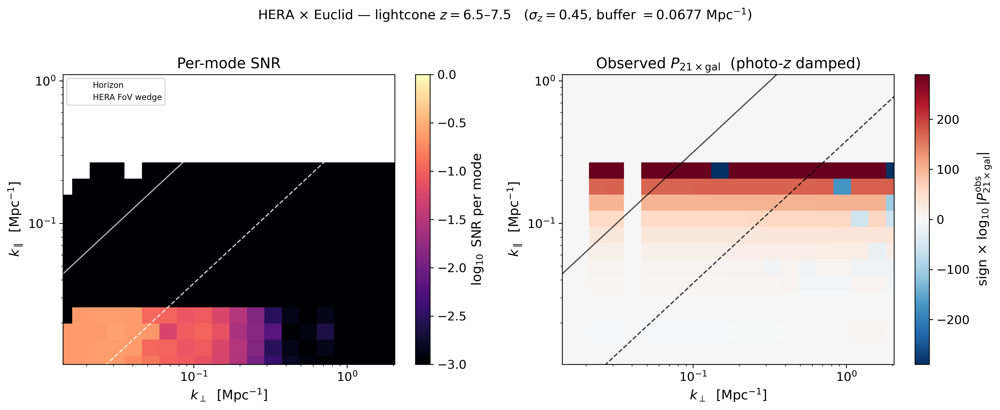

Total cross-correlation SNR (outside wedge): 0 σ
Detection (> 5σ) ?  NO


In [28]:
# ======================================================================
#  Every quantity below already lives on `budget` — nothing is recomputed.
# ======================================================================
SNR_per_mode      = budget.snr.snr_per_mode
SNR_outside_wedge = budget.snr.snr_outside_wedge
total_snr         = budget.total_snr

# ── Plot ───────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

# Wedge and horizon lines for overlay (computed in the wedge-geometry cell)
k_par_horizon_ = k_perp_line * budget.horizon_slope
k_par_fov_     = k_perp_line * budget.fov_slope

# Panel 1: per-mode SNR
snr_display = fill_nan_nearest(np.log10(SNR_per_mode.T))
im_snr = axes[0].pcolormesh(
    k_perp, k_parallel, snr_display,
    cmap="magma", shading="auto", vmin=-3, vmax=0,
)
fig.colorbar(im_snr, ax=axes[0], label=r"$\log_{10}$ SNR per mode")
axes[0].plot(k_perp_line, k_par_horizon_, "w-",  lw=1.2, alpha=0.7, label="Horizon")
axes[0].plot(k_perp_line, k_par_fov_,     "w--", lw=1.2, alpha=0.8, label="HERA FoV wedge")
axes[0].legend(loc="upper left", fontsize=8)
axes[0].set_title("Per-mode SNR")

# Panel 2: observed cross-power
cross_amp_  = np.abs(P_cross_observed.T)
cross_sgn_  = np.sign(P_cross_observed.T)
signed_raw_ = np.where(cross_amp_ > 0, np.log10(cross_amp_) * cross_sgn_, 0.0)
signed_log_ = fill_nan_nearest(signed_raw_)
clim_       = np.nanpercentile(np.abs(signed_log_[signed_log_ != 0]), 95)

im_cross = axes[1].pcolormesh(
    k_perp, k_parallel, signed_log_,
    cmap="RdBu_r", shading="auto", vmin=-clim_, vmax=clim_,
)
fig.colorbar(
    im_cross, ax=axes[1],
    label=r"sign $\times$ $\log_{10}|P_{21 \times \rm gal}^{\rm obs}|$",
)
axes[1].plot(k_perp_line, k_par_horizon_, "k-",  lw=1.2, alpha=0.7)
axes[1].plot(k_perp_line, k_par_fov_,     "k--", lw=1.2, alpha=0.8)
axes[1].set_title(r"Observed $P_{21 \times \rm gal}$  (photo-$z$ damped)")

for ax in axes:
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$k_\perp$  [Mpc$^{-1}$]")
    ax.set_ylabel(r"$k_\parallel$  [Mpc$^{-1}$]")
    ax.set_xlim(k_perp[0], k_perp[-1])
    ax.set_ylim(k_parallel[0], k_parallel[-2])

plt.suptitle(
    rf"HERA $\times$ Euclid — lightcone $z = {z_min}$–${z_max}$   "
    rf"($\sigma_z = {photoz_uncertainty}$, buffer $= {wedge_buffer}$ Mpc$^{{-1}}$)",
    fontsize=13, y=1.02,
)
plt.tight_layout()
plt.show()

# ── Total detection significance ───────────────────────────────────────────
print(f"Total cross-correlation SNR (outside wedge): {total_snr:.3g} σ")
print(f"Detection (> 5σ) ?  {'YES' if budget.detected else 'NO'}")

## 10  Summary

This notebook demonstrates the end-to-end workflow for simulating a
HERA × Euclid 21 cm–galaxy cross-correlation using a **21cmFASTv4 lightcone**:

1. **21cmFASTv4** generates a self-consistent lightcone via `RectilinearLightconer`
   + `run_lightcone`, covering $z = z_{\rm min}$–$z_{\rm max}$ in a single run
2. The **non-cubic box** $(N_\perp \times N_\perp \times N_z)$ is handled throughout,
   with separate cell sizes for the transverse and LOS directions
3. A **Euclid-like** galaxy field is extracted from the lightcone `halo_sfr`
4. The **2D cross-power spectrum** $P_{21 \times \rm gal}(k_\perp, k_\parallel)$
   is computed and shows the expected large-scale anti-correlation
5. The **uncertainty budget** — photo-$z$ damping, foreground wedge, HERA
   thermal noise, galaxy shot noise, and La Plante Eqs. 15–17 — is applied at
   $z_{\rm obs}$
6. The **SNR map** identifies which Fourier modes drive the detection

### This notebook and the HPC pipeline share their code

Every formula is imported from `src/`; nothing is reimplemented here. The
notebook and `run_pipeline.py` therefore cannot drift apart.

| Concern | Function | Module |
|---|---|---|
| $H(z)$, $D_C(z)$ | `hubble_parameter`, `comoving_distance` | `src/analysis.py` |
| Power spectra | `compute_all_power_spectra` | `src/analysis.py` |
| Wedge geometry | `horizon_wedge_slope`, `fov_wedge_slope` | `src/analysis.py` |
| The whole budget | `compute_uncertainty_budget` | `src/analysis.py` |
| UV calibration | `sfr_to_Luv` | `src/conversions.py` |

To run the same analysis headlessly on a cluster:

```bash
bash submit_job.sh --sim force              # full run
python run_pipeline.py --plots budget       # budget only, from cached spectra
```

`src/figures.py` is deliberately **not** imported here: it forces the
non-interactive `Agg` backend on import, which would disable inline plotting.

### Parameters that changed relative to earlier versions of this notebook

| Parameter | Was | Now | Why |
|---|---|---|---|
| $\sigma_z$ | 0.059 | **0.45** | 0.059 was $\sigma_z/(1+z)$ used as an absolute $\sigma_z$; Euclid's requirement at $z=7$ is $\approx 0.45$ |
| $k_{\rm buffer}$ | 0.02 | **0.0677** Mpc⁻¹ | 0.1 $h$ Mpc⁻¹, Pober et al. (2014) "moderate"; the earlier value had no stated provenance |
| $\nu_{21}$ in the noise cell | 1.42 GHz | **1420.405 MHz** | the cell hardcoded a value differing from this notebook's own `F_21_HZ` |
| $H(z_{\rm obs})$ in the wedge cell | `Planck18.H(z)` | `hubble_parameter(z_obs, …)` | `z` was a stale loop variable, not `z_obs` |

Both $\sigma_z$ and the buffer can be swept from the pipeline CLI without
re-running anything expensive:
`python run_pipeline.py --sigma-z 0.059 --wedge-buffer 0.02`.

### Key differences vs. the coeval version

| Feature | Coeval | Lightcone |
|---|---|---|
| 21cmFAST function | `run_coeval` | `run_lightcone` |
| Box shape | $(N, N, N)$ | $(N, N, N_z)$ |
| Redshift | single snapshot | continuous $z_{\rm min}$–$z_{\rm max}$ |
| LOS cell size | same as transverse | $L_{\rm LOS}/N_z$ |
| Field access | `coeval.brightness_temp` | `lightcone.lightcones['brightness_temp']` |
| Neutral fraction | `coeval.xH_box` | `lightcone.lightcones['neutral_fraction']` |

### To improve for publication

- Use larger boxes (1 Gpc, 2 Mpc cells) as in Davies et al. (2025)
- Replace the simplified $P_{N,21}$ with [21cmSense](https://github.com/rasg-affiliates/21cmSense),
  or with La Plante Eq. 11 ($X^2 Y \Omega'/n(k_\perp)$), which resolves the
  noise in $k_\perp$ — a worked implementation is in
  `21cm_galaxy_cross_uncertainty.ipynb`
- Divide `mode_counts` into the per-bin variance (see §6)
- Evolve $H(z)$, $\sigma_r$ and the wedge slope **along** the line of sight
  instead of fixing them at $z_{\rm obs}$ — at $\Delta z = 1$, $H(z)$ varies by
  ~16 % across the box
- Enable `apply_rsds=True` in `generate_lightcone` for self-consistent RSDs
- Sweep over $\sigma_z$ and magnitude limits to optimise survey design

### References

- Davies, Mesinger & Murray (2025) — [arXiv:2504.17254](https://arxiv.org/abs/2504.17254)
- Gagnon-Hartman, Davies & Mesinger (2025) — [arXiv:2502.20447](https://arxiv.org/abs/2502.20447)
- La Plante et al. (2023) — [arXiv:2205.09770](https://arxiv.org/abs/2205.09770) — Eqs. 15–17
- Lidz et al. (2009) — [arXiv:0806.1055](https://arxiv.org/abs/0806.1055) — original variance derivation
- Pober et al. (2014) — [arXiv:1310.7031](https://arxiv.org/abs/1310.7031) — wedge buffer
- Murray, Greig & Mesinger (2020) — [JOSS 5(54)](https://doi.org/10.21105/joss.02582)
- Project documentation: [`docs/uncertainty_budget.md`](docs/uncertainty_budget.md), [`docs/HPC.md`](docs/HPC.md)

In [ ]:
# ================================================================
# Check whether stochastic halo sampling is enabled
# ================================================================

print(inputs.matter_options)

if hasattr(inputs.matter_options, "asdict"):
    print(inputs.matter_options.asdict())

MatterOptions:DEXM_OPTIMIZE               : False
    FILTER                      : spherical-tophat
    HALO_FILTER                 : spherical-tophat
    HMF                         : ST
    KEEP_3D_VELOCITIES          : False
    MINIMIZE_MEMORY             : False
    PERTURB_ALGORITHM           : 2LPT
    PERTURB_ON_HIGH_RES         : False
    POWER_SPECTRUM              : EH
    SAMPLE_METHOD               : MASS-LIMITED
    SMOOTH_EVOLVED_DENSITY_FIELD: False
    SOURCE_MODEL                : CHMF-SAMPLER
    USE_FFTW_WISDOM             : False
    USE_INTERPOLATION_TABLES    : hmf-interpolation
    USE_RELATIVE_VELOCITIES     : False 
{'HMF': 'ST', 'USE_RELATIVE_VELOCITIES': False, 'POWER_SPECTRUM': 'EH', 'PERTURB_ON_HIGH_RES': False, 'USE_INTERPOLATION_TABLES': 'hmf-interpolation', 'MINIMIZE_MEMORY': False, 'KEEP_3D_VELOCITIES': False, 'SAMPLE_METHOD': 'MASS-LIMITED', 'FILTER': 'spherical-tophat', 'HALO_FILTER': 'spherical-tophat', 'SMOOTH_EVOLVED_DENSITY_FIELD': False, 'DEXM